In [3]:
!pip -q install imageio tqdm --upgrade

import os, zipfile, glob, random, numpy as np
from pathlib import Path
import torch
import matplotlib.pyplot as plt

def set_seed(s=42):
    random.seed(s); np.random.seed(s)
    torch.manual_seed(s); torch.cuda.manual_seed_all(s)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
set_seed(42)

class CFG:
    data_root  = "/content/DRIVE"
    img_size   = 512
    batch      = 4
    workers    = 2
    train_val  = (0.8, 0.2)
    epochs_unet = 12
    epochs_fcn  = 12
    lr = 1e-3
    wd = 1e-5
    thr = 0.5
    out_dir = "/content/drive_runs"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
os.makedirs(CFG.out_dir, exist_ok=True)
print("Device:", DEVICE)

if not os.path.exists("/root/.kaggle/kaggle.json"):
    from google.colab import files
    print("Upload your kaggle.json (from https://www.kaggle.com/settings/account)")
    up = files.upload()
    os.makedirs("/root/.kaggle", exist_ok=True)
    with open("/root/.kaggle/kaggle.json","wb") as f: f.write(up["kaggle.json"])
    os.chmod("/root/.kaggle/kaggle.json", 0o600)

zip_path = "/content/drive-digital-retinal-images-for-vessel-extraction.zip"
if not os.path.exists(zip_path):
    !kaggle datasets download -d andrewmvd/drive-digital-retinal-images-for-vessel-extraction -p /content -q

if not os.path.exists("/content/DRIVE"):
    !unzip -q -o /content/drive-digital-retinal-images-for-vessel-extraction.zip -d /content/

def list_dir(p):
    p = Path(p)
    if not p.exists(): return f"{p} (missing)"
    items = sorted([x.name for x in p.iterdir()])
    return f"{p.name} -> {items[:5]}{' ...' if len(items)>5 else ''} ({len(items)} items)"

print(list_dir("/content"))
print(list_dir("/content/DRIVE"))
print(list_dir("/content/data"))
print(list_dir("/content/data/DRIVE"))
print(list_dir("/content/data/DRIVE/DRIVE"))

Device: cuda
Upload your kaggle.json (from https://www.kaggle.com/settings/account)


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/andrewmvd/drive-digital-retinal-images-for-vessel-extraction
License(s): other
content -> ['.config', 'DRIVE', 'drive-digital-retinal-images-for-vessel-extraction.zip', 'drive_runs', 'kaggle.json'] ... (6 items)
DRIVE -> ['test', 'training'] (2 items)
/content/data (missing)
/content/data/DRIVE (missing)
/content/data/DRIVE/DRIVE (missing)


In [4]:
import torch, os

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE, "| CUDA:", torch.version.cuda if torch.cuda.is_available() else "n/a")

torch.set_float32_matmul_precision("high")
if DEVICE == "cuda":
    torch.backends.cudnn.benchmark = True
    torch.backends.cuda.matmul.allow_tf32 = True

try:
    CFG.batch    = min(getattr(CFG, "batch", 4), 4)
    CFG.workers  = max(getattr(CFG, "workers", 2), 2)
    CFG.img_size = getattr(CFG, "img_size", 512)
except NameError:
    class CFG:
        batch, workers, img_size = 4, 2, 512

print(f"Using batch={CFG.batch}, workers={CFG.workers}, img_size={CFG.img_size}")

Device: cuda | CUDA: 12.6
Using batch=4, workers=2, img_size=512


/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


Using DRIVE root: /content/DRIVE
training: images=20 masks=20 pairs=20 (1st_manual)
test: images=20 masks=20 pairs=20 (mask)
splits: 16 4 20


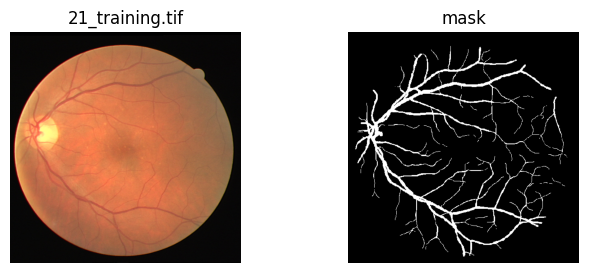

In [5]:
import re, cv2, imageio.v2 as imageio
from torch.utils.data import Dataset, DataLoader

def find_drive_root(preferred: str|Path|None = None) -> Path:
    cands = []
    if preferred: cands.append(Path(preferred))
    cands += [
        Path("/content/DRIVE"),
        Path("/content/data/DRIVE/DRIVE"),
        Path("/content/drive-digital-retinal-images-for-vessel-extraction/DRIVE"),
        Path("/kaggle/input/drive-digital-retinal-images-for-vessel-extraction/DRIVE"),
    ]
    for base in cands:
        if (base/"training/images").exists() and (base/"test/images").exists():
            return base
    hits = glob.glob("/content/**/training/images/*.tif", recursive=True)
    for h in hits:
        base = Path(h).parents[2]
        if (base/"test/images").exists(): return base
    raise FileNotFoundError("Could not locate DRIVE root.")

root = find_drive_root(CFG.data_root)
CFG.data_root = str(root)
print("Using DRIVE root:", CFG.data_root)

IMG_EXTS  = (".tif", ".tiff", ".png", ".jpg", ".jpeg", ".bmp")
MASK_EXTS = (".gif", ".png", ".tif", ".tiff", ".jpg", ".jpeg", ".bmp")

def _best_mask_dir(base: Path):
    for name in ["1st_manual","manual","labels","gt","ground_truth","mask","masks"]:
        p = base / name
        if p.exists() and p.is_dir():
            try: next(iter(p.iterdir())); return p
            except StopIteration: pass
    return None

def _collect(folder: Path, exts):
    out=[]; folder=Path(folder)
    for e in exts: out += sorted(folder.glob(f"*{e}"))
    return [str(p) for p in out]

def _fid(path: str):
    s = Path(path).stem.lower()
    m = re.search(r"(\d{2})", s) or re.search(r"(\d+)", s)
    return m.group(1) if m else s

def make_pairs(split_dir: Path):
    img_dir  = split_dir / "images"
    mask_dir = _best_mask_dir(split_dir)
    if not img_dir.exists(): raise FileNotFoundError(f"Missing images: {img_dir}")
    if mask_dir is None:     raise FileNotFoundError(f"No mask folder under: {split_dir}")
    imgs  = _collect(img_dir,  IMG_EXTS)
    masks = _collect(mask_dir, MASK_EXTS)
    if not imgs:  raise RuntimeError(f"No images in {img_dir}")
    if not masks: raise RuntimeError(f"No masks in {mask_dir}")
    imap = {_fid(p): p for p in imgs}
    mmap = {_fid(p): p for p in masks}
    keys = sorted(set(imap) & set(mmap))
    if not keys:
        for ki in list(imap):
            for km in list(mmap):
                if ki in km or km in ki:
                    keys.append(ki)
        keys = sorted(set(keys))
    pairs = [(imap[k], mmap[k]) for k in keys if k in mmap]
    print(f"{split_dir.name}: images={len(imgs)} masks={len(masks)} pairs={len(pairs)} ({Path(mask_dir).name})")
    return pairs

def _read_mask_any(mp: str):
    m = cv2.imread(str(mp), cv2.IMREAD_GRAYSCALE)
    if m is None:
        arr = imageio.imread(str(mp))
        if arr.ndim == 4: arr = arr[0]
        if arr.ndim == 3: arr = arr[...,0]
        m = arr.astype(np.uint8)
    return (m > 127).astype(np.uint8)

class DriveDataset(Dataset):
    def __init__(self, pairs, train=True, size=512):
        self.pairs = pairs
        self.train = train
        self.size  = size
    def __len__(self): return len(self.pairs)
    def __getitem__(self, i):
        ip, mp = self.pairs[i]
        img = cv2.cvtColor(cv2.imread(ip, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        mask = _read_mask_any(mp)
        H=W=self.size
        img  = cv2.resize(img,  (W,H), interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, (W,H), interpolation=cv2.INTER_NEAREST)
        if self.train:
            if random.random()<0.5: img,mask = img[:,::-1].copy(), mask[:,::-1].copy()
            if random.random()<0.15: img,mask = img[::-1].copy(),   mask[::-1].copy()
            if random.random()<0.25:
                k=random.choice([1,2,3])
                img,mask = np.rot90(img,k).copy(), np.rot90(mask,k).copy()
        x = torch.from_numpy(img.transpose(2,0,1)).float()/255.0
        y = torch.from_numpy(mask[None]).float()
        return x, y, ip

train_all = make_pairs(root/"training")
test_pairs= make_pairs(root/"test")
n_train = int(CFG.train_val[0]*len(train_all))
train_pairs, val_pairs = train_all[:n_train], train_all[n_train:]

train_loader = DataLoader(DriveDataset(train_pairs, True,  CFG.img_size), batch_size=CFG.batch, shuffle=True,  num_workers=CFG.workers, pin_memory=True)
val_loader   = DataLoader(DriveDataset(val_pairs,   False, CFG.img_size), batch_size=CFG.batch, shuffle=False, num_workers=CFG.workers, pin_memory=True)
test_loader  = DataLoader(DriveDataset(test_pairs,  False, CFG.img_size), batch_size=1,          shuffle=False, num_workers=CFG.workers, pin_memory=True)

print("splits:", len(train_pairs), len(val_pairs), len(test_pairs))

xb, yb, pb = next(iter(train_loader))
plt.figure(figsize=(8,3))
plt.subplot(1,2,1); plt.imshow(xb[0].permute(1,2,0)); plt.title(Path(pb[0]).name); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(yb[0,0], cmap="gray"); plt.title("mask"); plt.axis("off")
plt.show()

In [6]:
import torch.nn.functional as F

def binarize(logits, thr=0.5): return (torch.sigmoid(logits) > thr).float()

def dice_score(logits, target, eps=1e-7):
    p = binarize(logits)
    inter = (p*target).sum(dim=(2,3)); den = p.sum(dim=(2,3))+target.sum(dim=(2,3))
    return ((2*inter+eps)/(den+eps)).mean().item()

def iou_score(logits, target, eps=1e-7):
    p = binarize(logits)
    inter = (p*target).sum(dim=(2,3)); den = p.sum(dim=(2,3))+target.sum(dim=(2,3))-inter
    return ((inter+eps)/(den+eps)).mean().item()

def pixel_acc(logits, target): return (binarize(logits)==target).float().mean().item()

def preview_batch(model, loader, device, n=3, title="Preview"):
    model.eval()
    shown=0
    with torch.no_grad():
        for x,y,paths in loader:
            x,y = x.to(device), y.to(device)
            z = model(x); p = binarize(z)
            b = x.size(0)
            for i in range(b):
                img = x[i].permute(1,2,0).cpu().numpy()
                gt  = y[i,0].cpu().numpy()
                pr  = p[i,0].cpu().numpy()
                fig,ax = plt.subplots(1,3, figsize=(10,3.5))
                ax[0].imshow(img); ax[0].set_title("image"); ax[0].axis("off")
                ax[1].imshow(gt, cmap="gray"); ax[1].set_title("gt"); ax[1].axis("off")
                ax[2].imshow(pr, cmap="gray"); ax[2].set_title("pred"); ax[2].axis("off")
                fig.suptitle(f"{title} → {Path(paths[i]).name}")
                plt.show()
                shown+=1
                if shown>=n: return

def fit(model, tag, train_loader, val_loader, epochs=12, lr=1e-3, wd=1e-5, preview_every=4):
    model = model.to(DEVICE)
    opt   = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
    crit  = nn.BCEWithLogitsLoss()
    best_dice, best_path = -1.0, Path(CFG.out_dir)/f"best_{tag}.pt"

    scaler = torch.amp.GradScaler('cuda', enabled=(DEVICE=="cuda"))

    for ep in range(1, epochs+1):
        model.train()
        tr_loss=0.0
        for x,y,_ in train_loader:
            x,y = x.to(DEVICE), y.to(DEVICE)
            opt.zero_grad(set_to_none=True)
            with torch.amp.autocast('cuda', enabled=(scaler is not None and DEVICE=='cuda')):
                z = model(x); loss = crit(z,y)
            scaler.scale(loss).backward()
            scaler.step(opt); scaler.update()
            tr_loss += loss.item()
        tr_loss /= max(1,len(train_loader))

        model.eval(); vl=vd=vi=0.0
        with torch.no_grad():
            for x,y,_ in val_loader:
                x,y = x.to(DEVICE), y.to(DEVICE)
                z = model(x); vl += crit(z,y).item()
                vd += dice_score(z,y); vi += iou_score(z,y)
        vl/=max(1,len(val_loader)); vd/=max(1,len(val_loader)); vi/=max(1,len(val_loader))
        print(f"{tag} | ep {ep:02d} | train L {tr_loss:.4f} | val L {vl:.4f} D {vd:.4f} IOU {vi:.4f}")

        if vd > best_dice:
            best_dice = vd
            torch.save(model.state_dict(), best_path)
            print(f"  -> saved best {tag} to {best_path}")

        if preview_every and (ep % preview_every == 0):
            preview_batch(model, val_loader, DEVICE, n=2, title=f"{tag} @ ep {ep}")

    return str(best_path)

def test_report(ModelCtor, ckpt_path, tag, n_show=3):
    model = ModelCtor().to(DEVICE)
    model.load_state_dict(torch.load(ckpt_path, map_location=DEVICE))
    model.eval()
    crit = nn.BCEWithLogitsLoss()
    tl=td=ti=ta=0.0
    with torch.no_grad():
        for x,y,_ in test_loader:
            x,y = x.to(DEVICE), y.to(DEVICE)
            z = model(x)
            tl += crit(z,y).item()
            td += dice_score(z,y)
            ti += iou_score(z,y)
            ta += pixel_acc(z,y)
    n = max(1,len(test_loader))
    rpt = {"loss": round(tl/n,4), "dice": round(td/n,4), "iou": round(ti/n,4), "acc": round(ta/n,4)}
    print(f"[test {tag}] {rpt}")

    if n_show>0:
        preview_batch(model, test_loader, DEVICE, n=n_show, title=f"test {tag}")
    return rpt

def per_image_iou_avg(ModelCtor, ckpt_path):
    model = ModelCtor().to(DEVICE)
    model.load_state_dict(torch.load(ckpt_path, map_location=DEVICE))
    model.eval()
    out=[]
    with torch.no_grad():
        for x,y,_ in test_loader:
            x,y = x.to(DEVICE), y.to(DEVICE)
            z = model(x)
            out.append(iou_score(z,y))
    return float(np.mean(out))

unet | ep 01 | train L 0.6426 | val L 0.6433 D 0.0000 IOU 0.0000
  -> saved best unet to /content/drive_runs/best_unet.pt
unet | ep 02 | train L 0.4708 | val L 1.0619 D 0.1585 IOU 0.0861
  -> saved best unet to /content/drive_runs/best_unet.pt
unet | ep 03 | train L 0.4113 | val L 0.9243 D 0.1614 IOU 0.0878
  -> saved best unet to /content/drive_runs/best_unet.pt


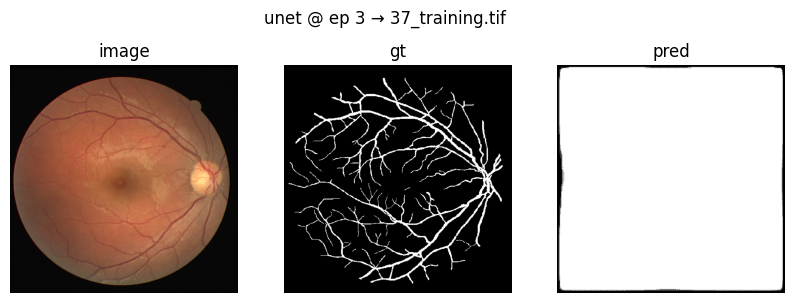

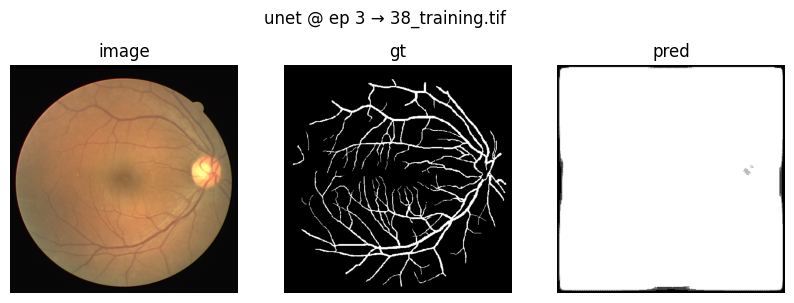

unet | ep 04 | train L 0.3838 | val L 0.8585 D 0.2152 IOU 0.1206
  -> saved best unet to /content/drive_runs/best_unet.pt
unet | ep 05 | train L 0.3647 | val L 0.6958 D 0.2105 IOU 0.1177
unet | ep 06 | train L 0.3429 | val L 0.8396 D 0.2207 IOU 0.1241
  -> saved best unet to /content/drive_runs/best_unet.pt


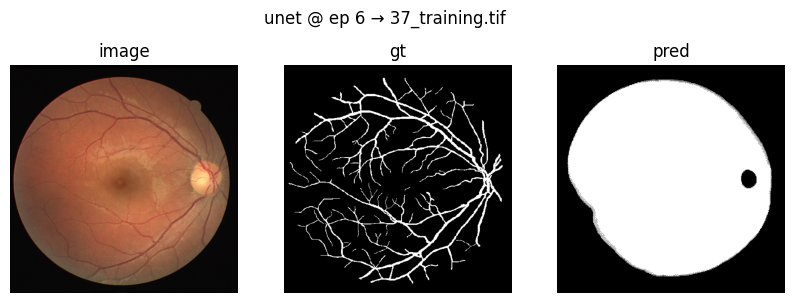

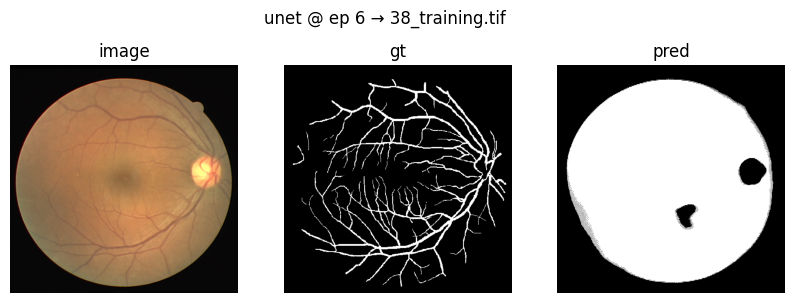

unet | ep 07 | train L 0.3224 | val L 0.5115 D 0.1569 IOU 0.0861
unet | ep 08 | train L 0.3044 | val L 0.3975 D 0.0000 IOU 0.0000
unet | ep 09 | train L 0.2904 | val L 0.3021 D 0.0000 IOU 0.0000


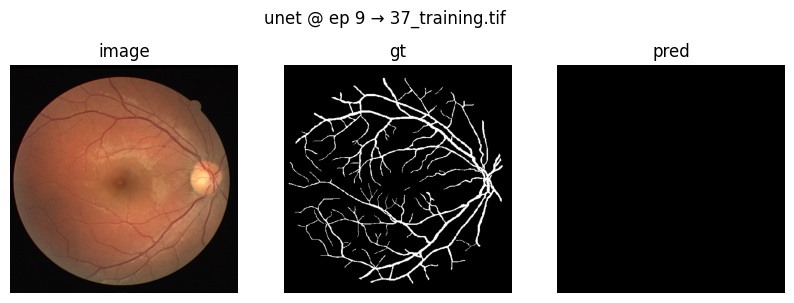

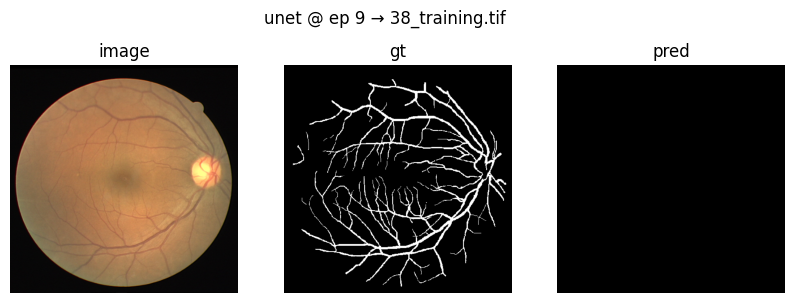

unet | ep 10 | train L 0.2753 | val L 0.2918 D 0.0009 IOU 0.0005
unet | ep 11 | train L 0.2619 | val L 0.2852 D 0.0100 IOU 0.0050
unet | ep 12 | train L 0.2450 | val L 0.2755 D 0.0157 IOU 0.0080


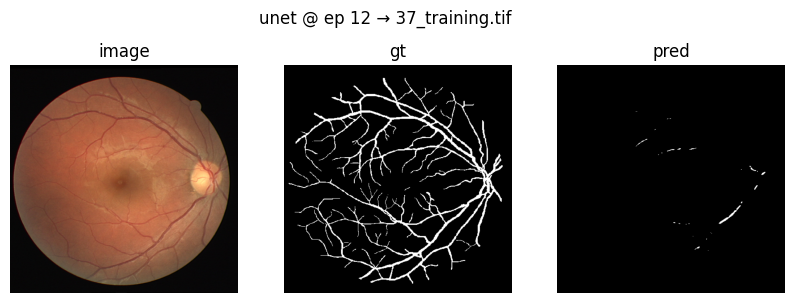

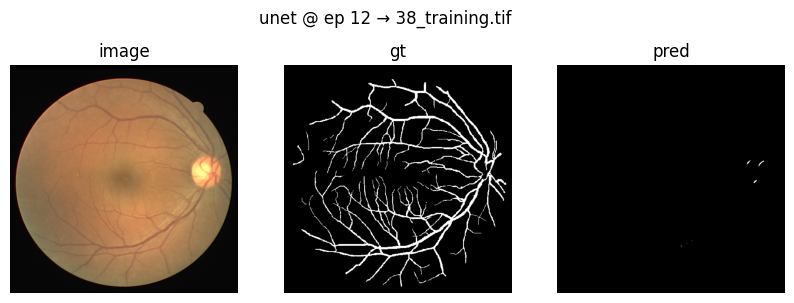

[test unet] {'loss': 0.4254, 'dice': 0.8851, 'iou': 0.8108, 'acc': 0.87}


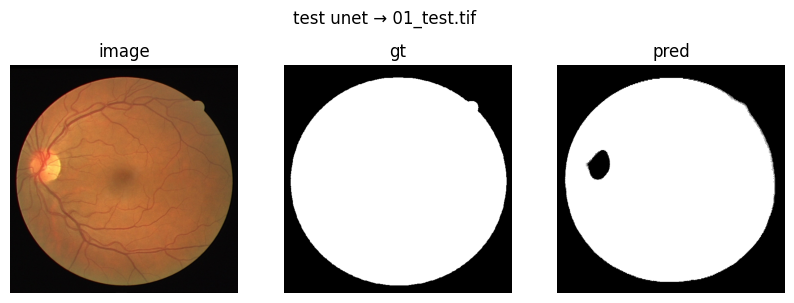

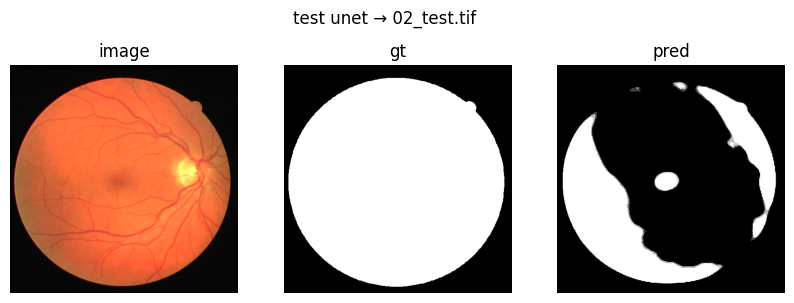

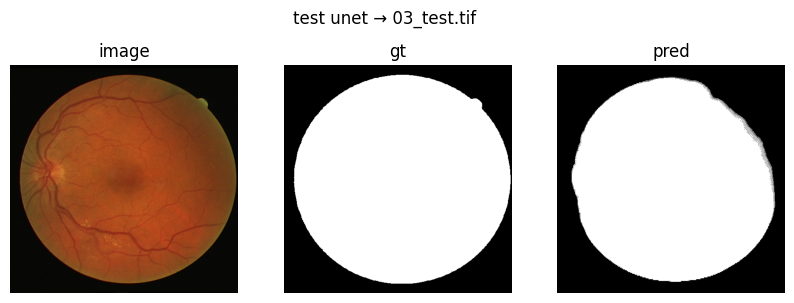

U-Net best ckpt: /content/drive_runs/best_unet.pt | report: {'loss': 0.4254, 'dice': 0.8851, 'iou': 0.8108, 'acc': 0.87}


In [ ]:
#U-NET
import torch.nn as nn

class Block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch,out_ch,3,1,1,bias=False), nn.BatchNorm2d(out_ch), nn.ReLU(True),
            nn.Conv2d(out_ch,out_ch,3,1,1,bias=False), nn.BatchNorm2d(out_ch), nn.ReLU(True),
        )
    def forward(self,x): return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1, feats=(64,128,256,512)):
        super().__init__()
        self.down = nn.ModuleList(); c=in_ch
        for f in feats: self.down.append(Block(c,f)); c=f
        self.pool = nn.MaxPool2d(2,2)
        self.bot  = Block(feats[-1], feats[-1]*2)
        self.up   = nn.ModuleList(); c=feats[-1]*2
        for f in reversed(feats):
            self.up.append(nn.ConvTranspose2d(c,f,2,2))
            self.up.append(Block(c,f)); c=f
        self.out = nn.Conv2d(c, out_ch, 1)
    def forward(self,x):
        skips=[]
        for d in self.down:
            x=d(x); skips.append(x); x=self.pool(x)
        x=self.bot(x); skips=skips[::-1]
        for i in range(0,len(self.up),2):
            x=self.up[i](x); s=skips[i//2]
            if x.shape[-2:]!=s.shape[-2:]:
                x=F.interpolate(x, size=s.shape[-2:], mode="bilinear", align_corners=False)
            x=torch.cat([s,x],1); x=self.up[i+1](x)
        return self.out(x)

tag = "unet"
unet_ckpt = fit(UNet(), tag, train_loader, val_loader, epochs=CFG.epochs_unet, lr=CFG.lr, wd=CFG.wd, preview_every=3)
unet_report = test_report(UNet, unet_ckpt, tag, n_show=3)
print("U-Net best ckpt:", unet_ckpt, "| report:", unet_report)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 192MB/s]


fcn_resnet50 | ep 01 | train L 1.2112 | val L 17.8453 D 0.1373 IOU 0.0742
  -> saved best fcn_resnet50 to /content/drive_runs/best_fcn_resnet50.pt
fcn_resnet50 | ep 02 | train L 0.4917 | val L 6.3062 D 0.0000 IOU 0.0000
fcn_resnet50 | ep 03 | train L 0.3523 | val L 0.5509 D 0.0000 IOU 0.0000


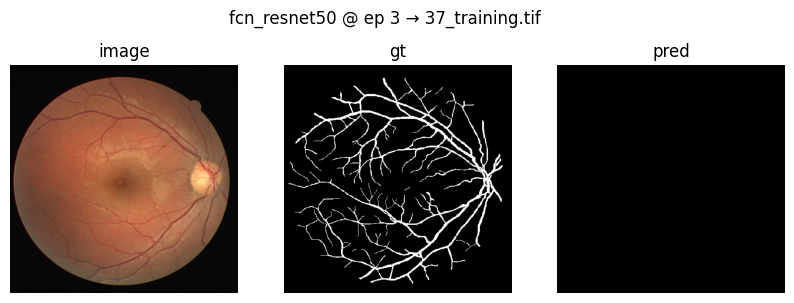

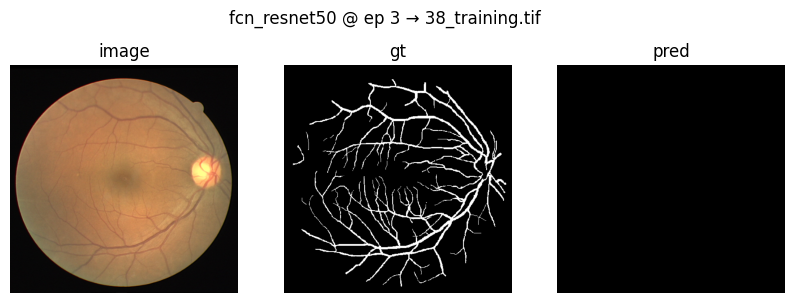

fcn_resnet50 | ep 04 | train L 0.2971 | val L 0.4091 D 0.0000 IOU 0.0000
fcn_resnet50 | ep 05 | train L 0.2739 | val L 0.3519 D 0.0000 IOU 0.0000
fcn_resnet50 | ep 06 | train L 0.2536 | val L 0.2764 D 0.0089 IOU 0.0045


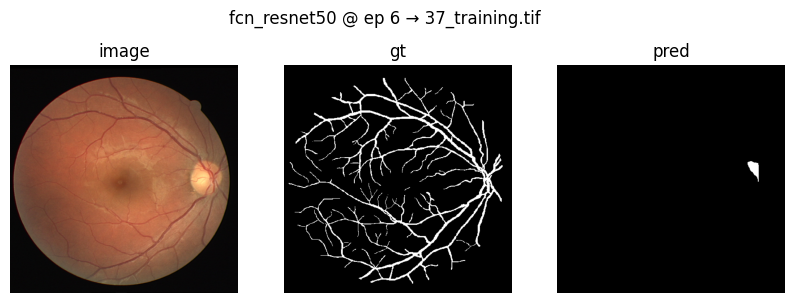

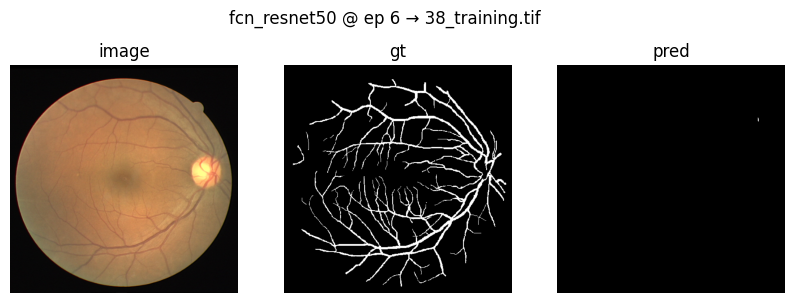

fcn_resnet50 | ep 07 | train L 0.2452 | val L 0.2866 D 0.0094 IOU 0.0048
fcn_resnet50 | ep 08 | train L 0.2350 | val L 0.3206 D 0.0134 IOU 0.0068
fcn_resnet50 | ep 09 | train L 0.2279 | val L 0.2696 D 0.0150 IOU 0.0076


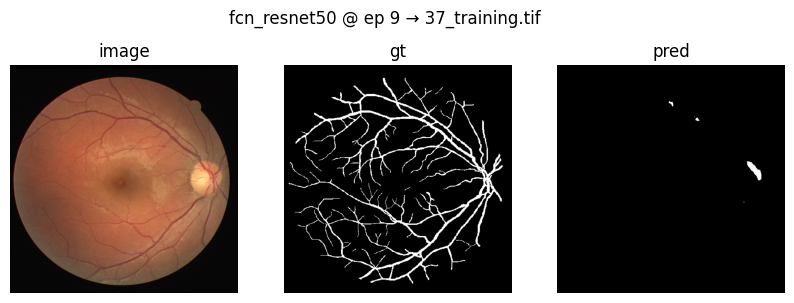

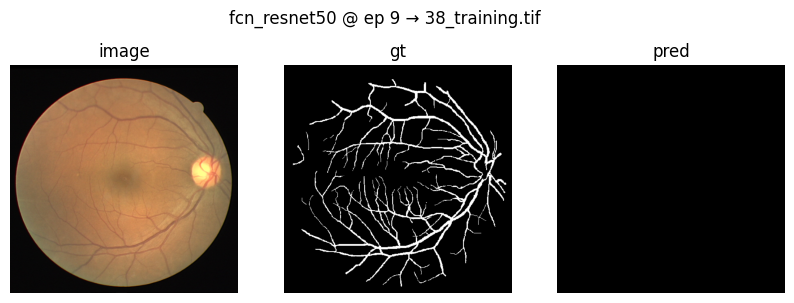

fcn_resnet50 | ep 10 | train L 0.2226 | val L 0.2399 D 0.0294 IOU 0.0151
fcn_resnet50 | ep 11 | train L 0.2179 | val L 0.2415 D 0.0497 IOU 0.0261
fcn_resnet50 | ep 12 | train L 0.2132 | val L 0.2306 D 0.0926 IOU 0.0500


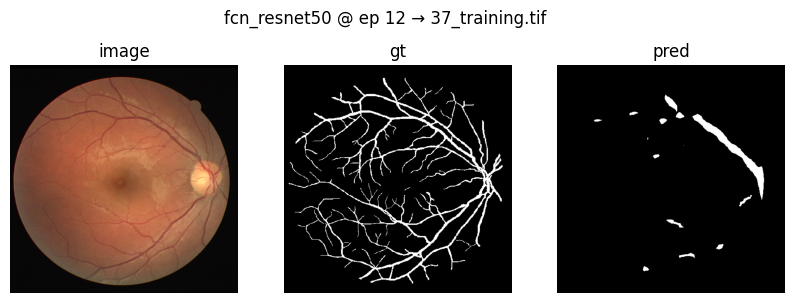

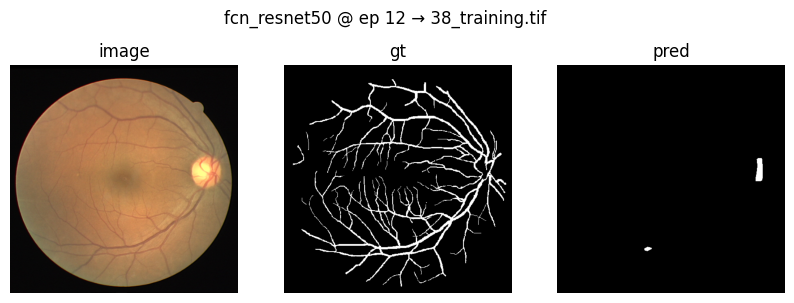

[test fcn_resnet50] {'loss': 8.5915, 'dice': 0.3095, 'iou': 0.1833, 'acc': 0.3735}


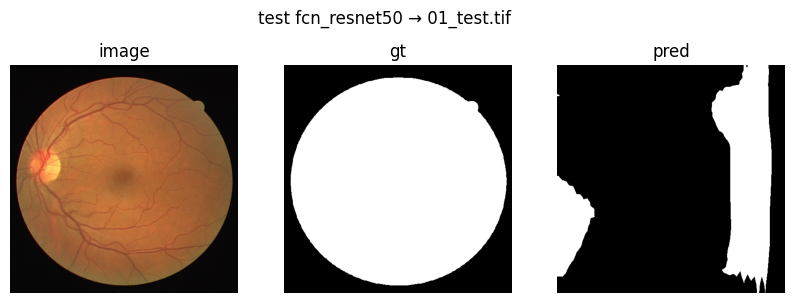

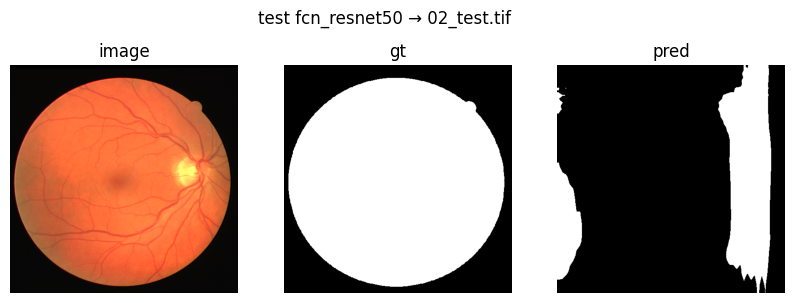

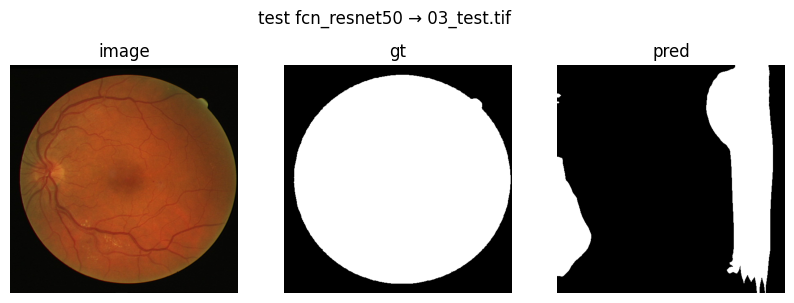

FCN-ResNet50 best ckpt: /content/drive_runs/best_fcn_resnet50.pt | report: {'loss': 8.5915, 'dice': 0.3095, 'iou': 0.1833, 'acc': 0.3735}
Saved copies -> True /content/drive_runs/saved_models/unet_model.pt | True /content/drive_runs/saved_models/fcn_resnet50_model.pt
[test U-Net] {'loss': 0.4254, 'dice': 0.8851, 'iou': 0.8108, 'acc': 0.87}
[test FCN-ResNet50] {'loss': 8.5915, 'dice': 0.3095, 'iou': 0.1833, 'acc': 0.3735}


,Model,Dice,Mean IoU,IoU (avg),Pixel Acc,Loss
0,U-Net,0.8851,0.8108,0.8108,0.8700,0.4254
1,FCN-ResNet50,0.3095,0.1833,0.1833,0.3735,8.5915


Saved table: /content/drive_runs/drive_baselines_comparison.csv


In [ ]:
#FCN-ResNet50
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models.segmentation import fcn_resnet50

class FCNResNet50(nn.Module):
    def __init__(self, num_classes=1):
        super().__init__()
        self.m = fcn_resnet50(weights=None, aux_loss=False)
        in_ch = self.m.classifier[4].in_channels
        self.m.classifier[4] = nn.Conv2d(in_ch, num_classes, 1)
    def forward(self, x):
        out = self.m(x)["out"]
        if out.shape[-2:] != x.shape[-2:]:
            out = F.interpolate(out, size=x.shape[-2:], mode="bilinear", align_corners=False)
        return out

tag = "fcn_resnet50"
fcn_ckpt = fit(FCNResNet50(), tag, train_loader, val_loader, epochs=CFG.epochs_fcn, lr=CFG.lr, wd=CFG.wd, preview_every=3)
fcn_report = test_report(FCNResNet50, fcn_ckpt, tag, n_show=3)
print("FCN-ResNet50 best ckpt:", fcn_ckpt, "| report:", fcn_report)

import shutil, os
SAVE_PATH = Path(CFG.out_dir) / "saved_models"
os.makedirs(SAVE_PATH, exist_ok=True)

u_copy = SAVE_PATH / "unet_model.pt"
f_copy = SAVE_PATH / "fcn_resnet50_model.pt"
shutil.copyfile(Path(CFG.out_dir)/"best_unet.pt", u_copy) if (Path(CFG.out_dir)/"best_unet.pt").exists() else None
shutil.copyfile(Path(CFG.out_dir)/"best_fcn_resnet50.pt", f_copy) if (Path(CFG.out_dir)/"best_fcn_resnet50.pt").exists() else None
print("Saved copies ->", u_copy.exists(), u_copy, "|", f_copy.exists(), f_copy)

import pandas as pd, numpy as np, os

def add_row(name, ctor, ckpt):
    rpt = test_report(ctor, ckpt, name, n_show=0)
    iou_avg = per_image_iou_avg(ctor, ckpt)
    return {
        "Model": name,
        "Dice": rpt["dice"],
        "Mean IoU": rpt["iou"],
        "IoU (avg)": round(iou_avg, 4),
        "Pixel Acc": rpt["acc"],
        "Loss": rpt["loss"],
    }

rows = []
if Path(CFG.out_dir, "best_unet.pt").exists():
    rows.append(add_row("U-Net", UNet, Path(CFG.out_dir, "best_unet.pt")))
if Path(CFG.out_dir, "best_fcn_resnet50.pt").exists():
    rows.append(add_row("FCN-ResNet50", FCNResNet50, Path(CFG.out_dir, "best_fcn_resnet50.pt")))

df = pd.DataFrame(rows).round(4)
display(df)

csv_path = Path(CFG.out_dir) / "drive_baselines_comparison.csv"
df.to_csv(csv_path, index=False)
print("Saved table:", csv_path)

unetpp | ep 01 | train L 0.6806 | val L 0.7149 D 0.1544 IOU 0.0837
  -> saved best unetpp to /content/drive_runs/best_unetpp.pt
unetpp | ep 02 | train L 0.5883 | val L 0.7111 D 0.1544 IOU 0.0837
unetpp | ep 03 | train L 0.5429 | val L 0.6948 D 0.1056 IOU 0.0561


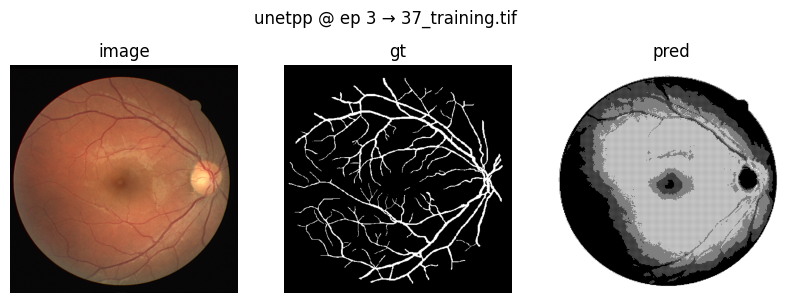

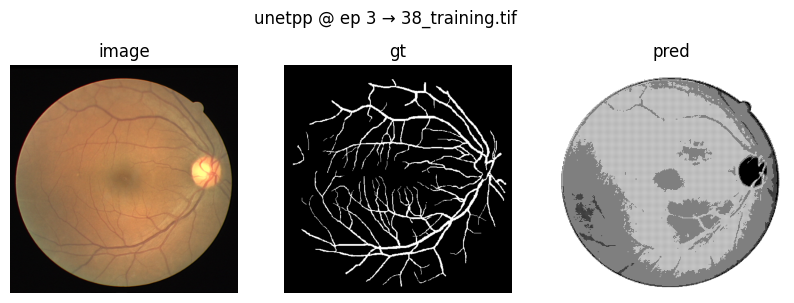

unetpp | ep 04 | train L 0.5101 | val L 0.6617 D 0.0000 IOU 0.0000
unetpp | ep 05 | train L 0.4820 | val L 0.6168 D 0.0000 IOU 0.0000
unetpp | ep 06 | train L 0.4611 | val L 0.5683 D 0.0000 IOU 0.0000


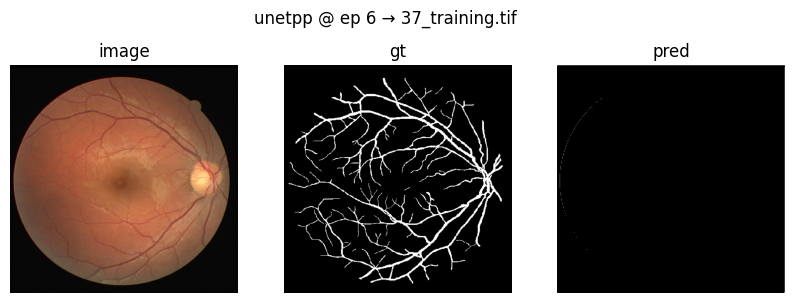

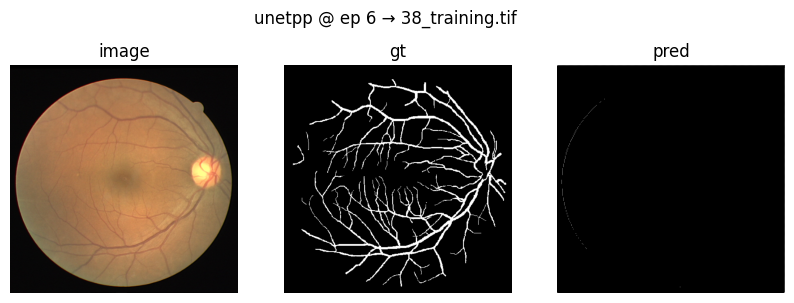

unetpp | ep 07 | train L 0.4448 | val L 0.5224 D 0.0000 IOU 0.0000
unetpp | ep 08 | train L 0.4268 | val L 0.4743 D 0.0000 IOU 0.0000
unetpp | ep 09 | train L 0.4081 | val L 0.4384 D 0.0018 IOU 0.0009


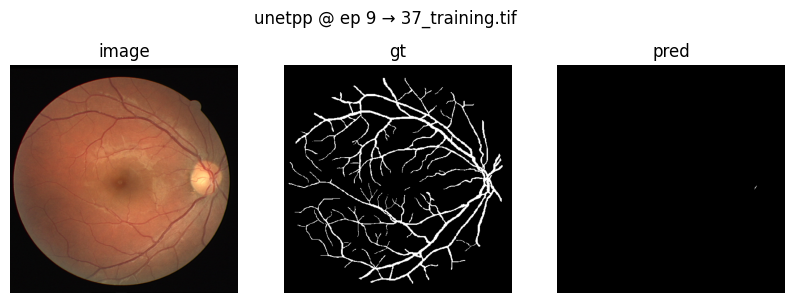

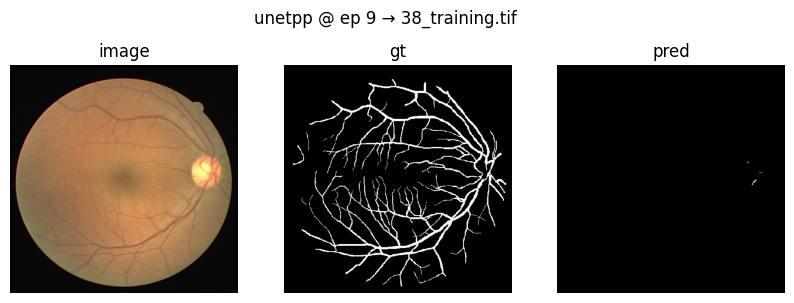

unetpp | ep 10 | train L 0.3914 | val L 0.4098 D 0.0082 IOU 0.0041
unetpp | ep 11 | train L 0.3740 | val L 0.3552 D 0.0078 IOU 0.0039
unetpp | ep 12 | train L 0.3595 | val L 0.3254 D 0.0158 IOU 0.0080


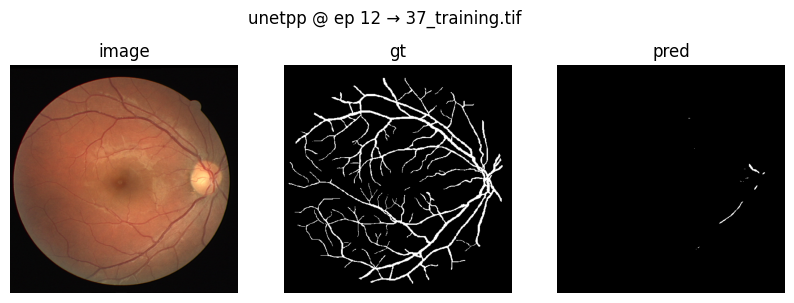

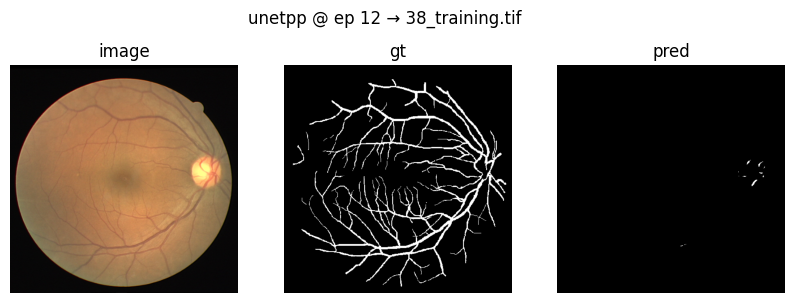

[test unetpp] {'loss': 0.6837, 'dice': 0.815, 'iou': 0.6877, 'acc': 0.6877}


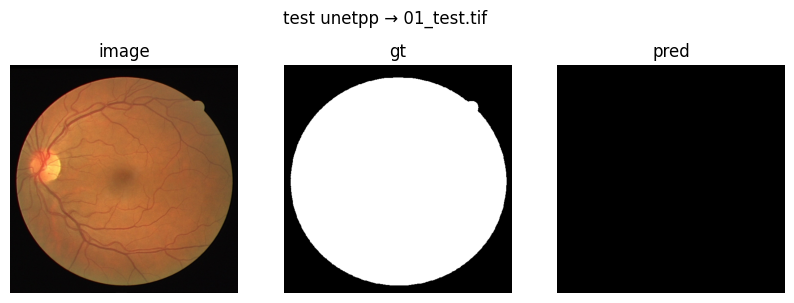

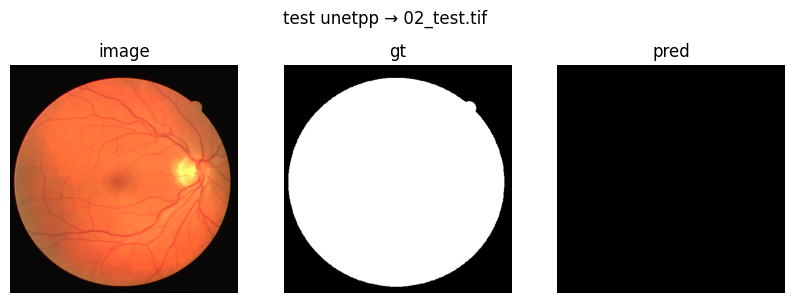

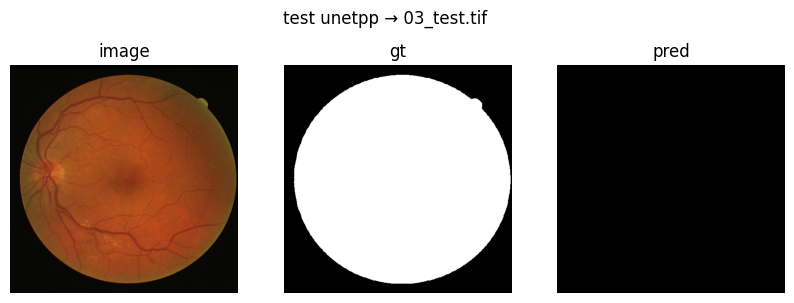

U-Net++ → {'loss': 0.6837, 'dice': 0.815, 'iou': 0.6877, 'acc': 0.6877, 'iou_avg_test': 0.6877}


In [ ]:
#U-Net++
import torch
import torch.nn as nn
import torch.nn.functional as F

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

class NestedUNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1, base=32):
        super().__init__()
        chs = [base, base*2, base*4, base*8, base*16]

        self.conv00 = ConvBlock(in_ch,    chs[0])
        self.conv10 = ConvBlock(chs[0],   chs[1])
        self.conv20 = ConvBlock(chs[1],   chs[2])
        self.conv30 = ConvBlock(chs[2],   chs[3])
        self.conv40 = ConvBlock(chs[3],   chs[4])
        self.pool  = nn.MaxPool2d(2,2)

        self.up40 = nn.ConvTranspose2d(chs[4], chs[3], 2, 2)
        self.up30 = nn.ConvTranspose2d(chs[3], chs[2], 2, 2)
        self.up20 = nn.ConvTranspose2d(chs[2], chs[1], 2, 2)
        self.up10 = nn.ConvTranspose2d(chs[1], chs[0], 2, 2)

        self.conv31 = ConvBlock(chs[3] + chs[3], chs[3])
        self.conv21 = ConvBlock(chs[2] + chs[2], chs[2])
        self.conv11 = ConvBlock(chs[1] + chs[1], chs[1])
        self.conv01 = ConvBlock(chs[0] + chs[0], chs[0])

        self.out   = nn.Conv2d(chs[0], out_ch, 1)

    def forward(self, x):
        x0_0 = self.conv00(x)
        x1_0 = self.conv10(self.pool(x0_0))
        x2_0 = self.conv20(self.pool(x1_0))
        x3_0 = self.conv30(self.pool(x2_0))
        x4_0 = self.conv40(self.pool(x3_0))

        x3_1 = self.conv31(torch.cat([x3_0, self._up_to(self.up40(x4_0), x3_0)], dim=1))
        x2_1 = self.conv21(torch.cat([x2_0, self._up_to(self.up30(x3_0), x2_0)], dim=1))
        x1_1 = self.conv11(torch.cat([x1_0, self._up_to(self.up20(x2_0), x1_0)], dim=1))
        x0_1 = self.conv01(torch.cat([x0_0, self._up_to(self.up10(x1_0), x0_0)], dim=1))

        logits = self.out(x0_1)
        return logits

    @staticmethod
    def _up_to(x, ref):
        if x.shape[-2:] != ref.shape[-2:]:
            x = F.interpolate(x, size=ref.shape[-2:], mode="bilinear", align_corners=False)
        return x

tag = "unetpp"
unetpp_ckpt = fit(NestedUNet(in_ch=3, out_ch=1, base=32),
                  tag,
                  train_loader,
                  val_loader,
                  epochs=CFG.epochs_unet,
                  lr=CFG.lr,
                  wd=CFG.wd,
                  preview_every=3)

unetpp_report = test_report(NestedUNet, unetpp_ckpt, tag, n_show=3)
unetpp_iouavg = per_image_iou_avg(NestedUNet, unetpp_ckpt)
print("U-Net++ →", {**unetpp_report, "iou_avg_test": round(unetpp_iouavg, 4)})

att_unet | ep 01 | train L 0.5507 | val L 0.6433 D 0.0000 IOU 0.0000
  -> saved best att_unet to /content/drive_runs/best_att_unet.pt
att_unet | ep 02 | train L 0.4575 | val L 0.6157 D 0.0000 IOU 0.0000
att_unet | ep 03 | train L 0.4128 | val L 0.5824 D 0.0000 IOU 0.0000


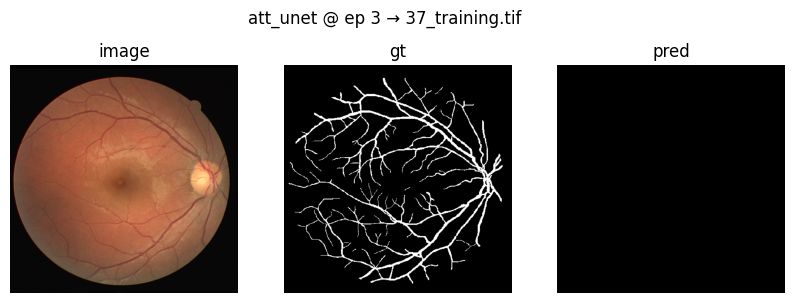

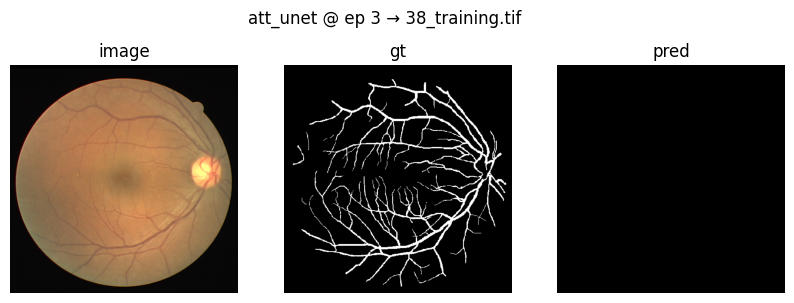

att_unet | ep 04 | train L 0.3779 | val L 0.5389 D 0.0000 IOU 0.0000
att_unet | ep 05 | train L 0.3514 | val L 0.4659 D 0.0000 IOU 0.0000
att_unet | ep 06 | train L 0.3297 | val L 0.3923 D 0.0000 IOU 0.0000


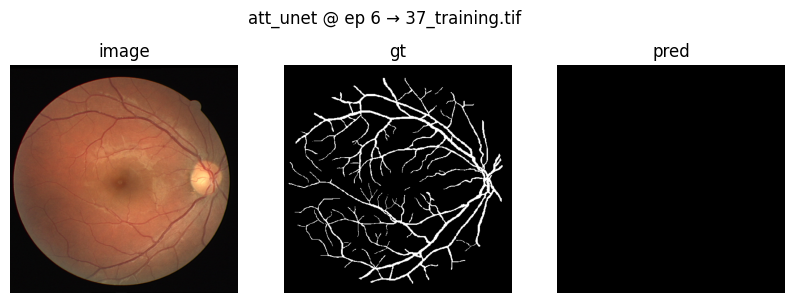

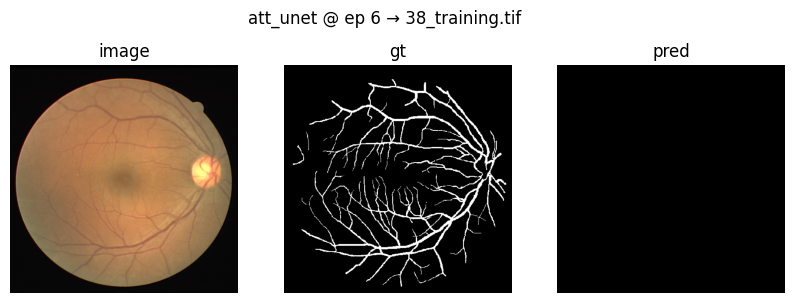

att_unet | ep 07 | train L 0.3210 | val L 0.3725 D 0.0000 IOU 0.0000
att_unet | ep 08 | train L 0.3033 | val L 0.3475 D 0.0007 IOU 0.0004
  -> saved best att_unet to /content/drive_runs/best_att_unet.pt
att_unet | ep 09 | train L 0.2891 | val L 0.3279 D 0.0059 IOU 0.0030
  -> saved best att_unet to /content/drive_runs/best_att_unet.pt


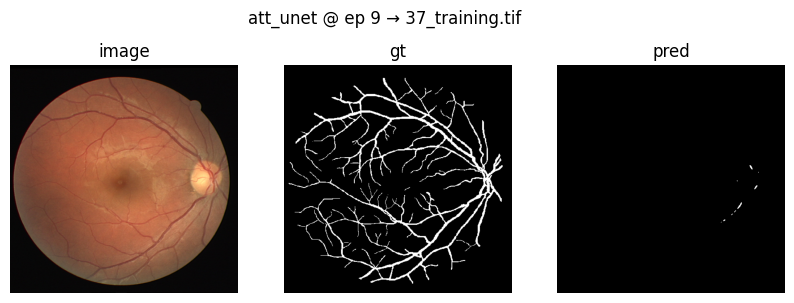

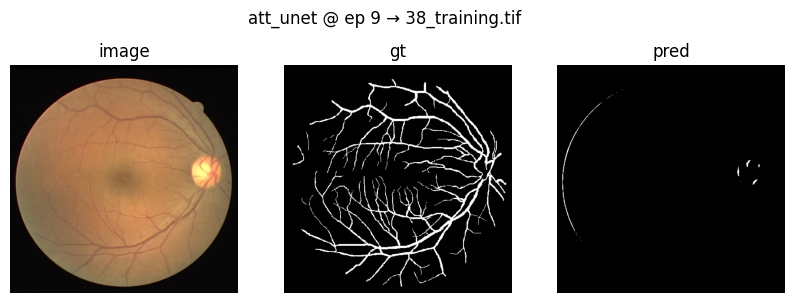

att_unet | ep 10 | train L 0.2758 | val L 0.3294 D 0.0171 IOU 0.0088
  -> saved best att_unet to /content/drive_runs/best_att_unet.pt
att_unet | ep 11 | train L 0.2631 | val L 0.3000 D 0.1258 IOU 0.0704
  -> saved best att_unet to /content/drive_runs/best_att_unet.pt
att_unet | ep 12 | train L 0.2537 | val L 0.2841 D 0.1721 IOU 0.1012
  -> saved best att_unet to /content/drive_runs/best_att_unet.pt


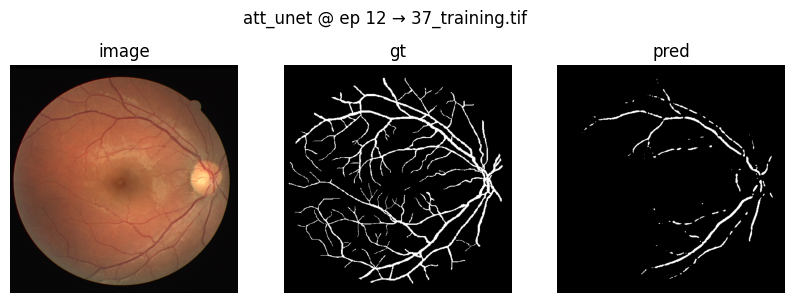

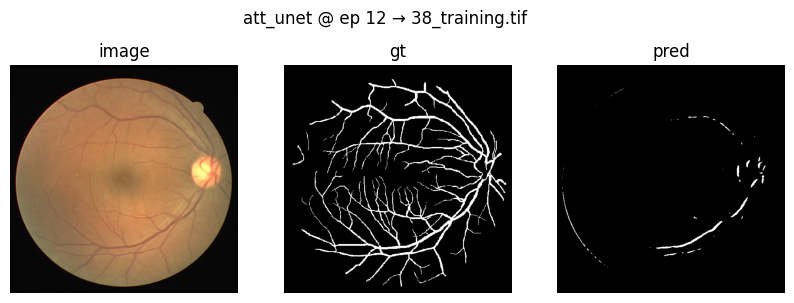

[test att_unet] {'loss': 1.2821, 'dice': 0.0199, 'iou': 0.0101, 'acc': 0.3191}


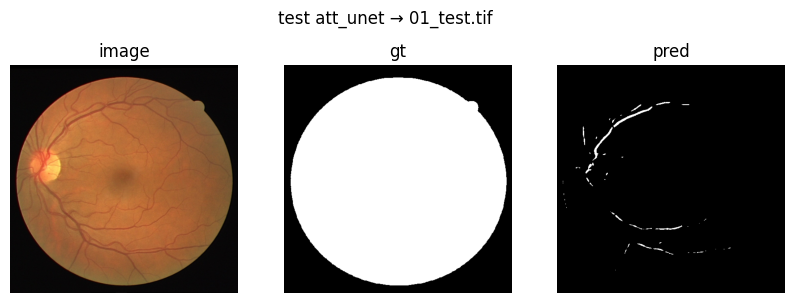

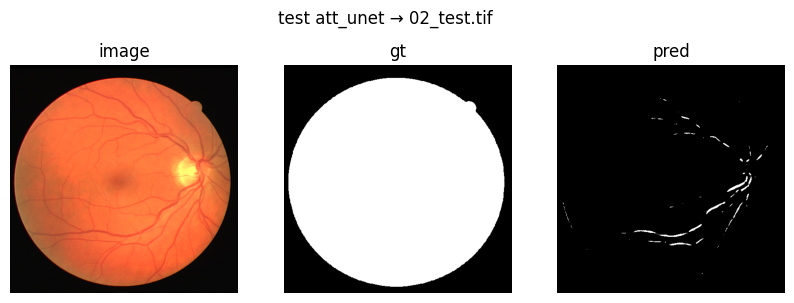

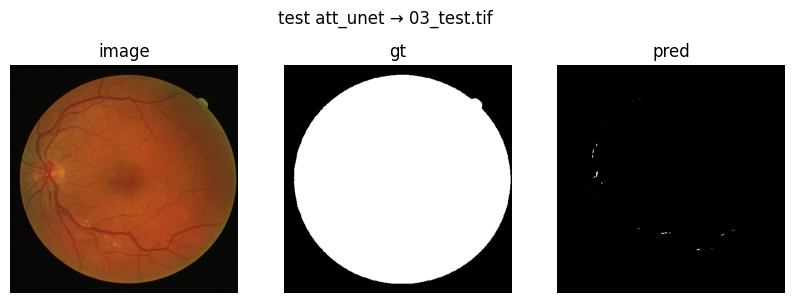

Attention U-Net → {'loss': 1.2821, 'dice': 0.0199, 'iou': 0.0101, 'acc': 0.3191, 'iou_avg_test': 0.0101}


In [ ]:
#Attention U-Net
import torch
import torch.nn as nn
import torch.nn.functional as F

class AttnConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, 1, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, 1, bias=True),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, 1, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        if g.shape[-2:] != x.shape[-2:]:
            g = F.interpolate(g, size=x.shape[-2:], mode="bilinear", align_corners=False)
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class AttUNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1, base=32):
        super().__init__()
        chs = [base, base*2, base*4, base*8, base*16]

        self.c1 = AttnConvBlock(in_ch,   chs[0])
        self.c2 = AttnConvBlock(chs[0],  chs[1])
        self.c3 = AttnConvBlock(chs[1],  chs[2])
        self.c4 = AttnConvBlock(chs[2],  chs[3])
        self.c5 = AttnConvBlock(chs[3],  chs[4])
        self.pool = nn.MaxPool2d(2,2)

        self.up4 = nn.ConvTranspose2d(chs[4], chs[3], 2, 2)
        self.att4 = AttentionGate(F_g=chs[3], F_l=chs[3], F_int=chs[3]//2)
        self.dc4 = AttnConvBlock(chs[4], chs[3])

        self.up3 = nn.ConvTranspose2d(chs[3], chs[2], 2, 2)
        self.att3 = AttentionGate(F_g=chs[2], F_l=chs[2], F_int=chs[2]//2)
        self.dc3 = AttnConvBlock(chs[3], chs[2])

        self.up2 = nn.ConvTranspose2d(chs[2], chs[1], 2, 2)
        self.att2 = AttentionGate(F_g=chs[1], F_l=chs[1], F_int=chs[1]//2)
        self.dc2 = AttnConvBlock(chs[2], chs[1])

        self.up1 = nn.ConvTranspose2d(chs[1], chs[0], 2, 2)
        self.att1 = AttentionGate(F_g=chs[0], F_l=chs[0], F_int=chs[0]//2)
        self.dc1 = AttnConvBlock(chs[1], chs[0])

        self.out = nn.Conv2d(chs[0], out_ch, 1)

    def forward(self, x):
        x1 = self.c1(x)
        x2 = self.c2(self.pool(x1))
        x3 = self.c3(self.pool(x2))
        x4 = self.c4(self.pool(x3))
        x5 = self.c5(self.pool(x4))

        d4 = self.up4(x5)
        x4_att = self.att4(d4, x4)
        d4 = self.dc4(torch.cat([d4, x4_att], dim=1))

        d3 = self.up3(d4)
        x3_att = self.att3(d3, x3)
        d3 = self.dc3(torch.cat([d3, x3_att], dim=1))

        d2 = self.up2(d3)
        x2_att = self.att2(d2, x2)
        d2 = self.dc2(torch.cat([d2, x2_att], dim=1))

        d1 = self.up1(d2)
        x1_att = self.att1(d1, x1)
        d1 = self.dc1(torch.cat([d1, x1_att], dim=1))

        return self.out(d1)

tag = "att_unet"
attunet_ckpt = fit(AttUNet(in_ch=3, out_ch=1, base=32),
                   tag,
                   train_loader,
                   val_loader,
                   epochs=CFG.epochs_unet,
                   lr=CFG.lr,
                   wd=CFG.wd,
                   preview_every=3)

attunet_report = test_report(AttUNet, attunet_ckpt, tag, n_show=3)
attunet_iouavg = per_image_iou_avg(AttUNet, attunet_ckpt)
print("Attention U-Net →", {**attunet_report, "iou_avg_test": round(attunet_iouavg, 4)})

resunet | ep 01 | train L 0.7708 | val L 0.6268 D 0.0000 IOU 0.0000
  -> saved best resunet to /content/drive_runs/best_resunet.pt
resunet | ep 02 | train L 0.4885 | val L 0.6119 D 0.0000 IOU 0.0000
resunet | ep 03 | train L 0.4274 | val L 0.5779 D 0.0000 IOU 0.0000


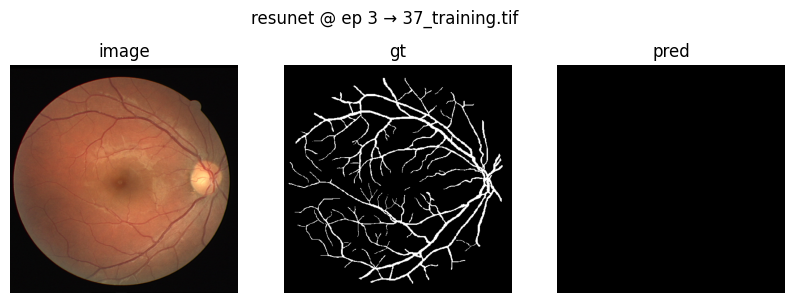

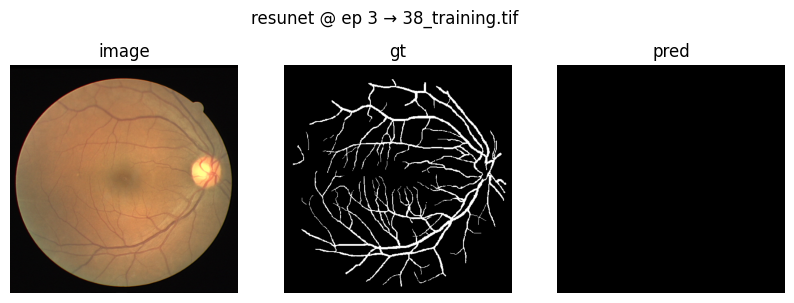

resunet | ep 04 | train L 0.3953 | val L 0.5334 D 0.0000 IOU 0.0000
resunet | ep 05 | train L 0.3755 | val L 0.4906 D 0.0000 IOU 0.0000
resunet | ep 06 | train L 0.3629 | val L 0.4566 D 0.0000 IOU 0.0000


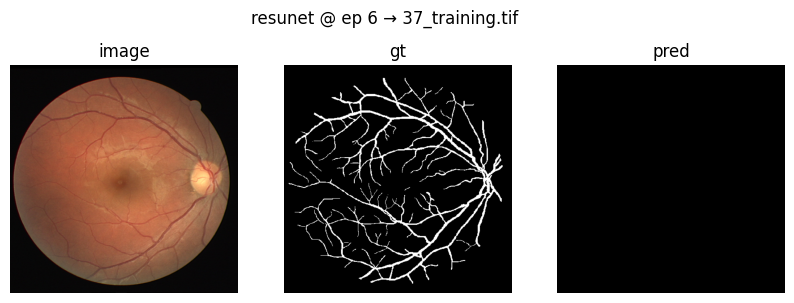

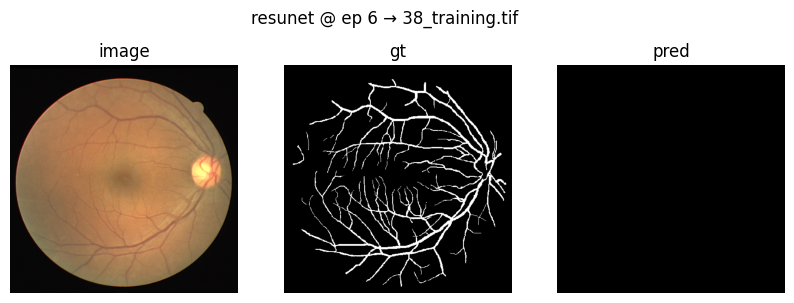

resunet | ep 07 | train L 0.3503 | val L 0.4269 D 0.0000 IOU 0.0000
resunet | ep 08 | train L 0.3361 | val L 0.4001 D 0.0000 IOU 0.0000
resunet | ep 09 | train L 0.3188 | val L 0.3758 D 0.0000 IOU 0.0000


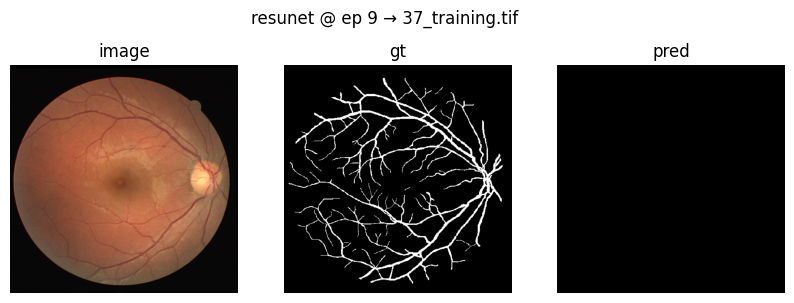

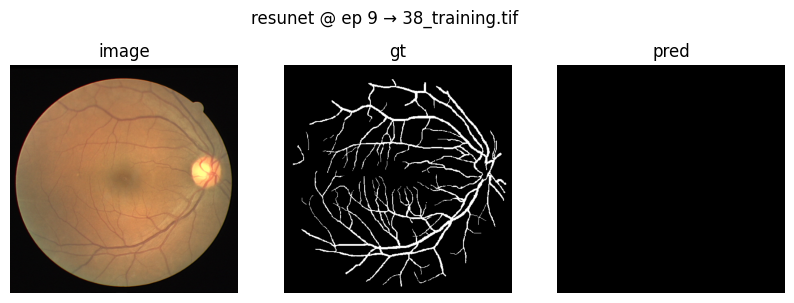

resunet | ep 10 | train L 0.3035 | val L 0.3570 D 0.0000 IOU 0.0000
resunet | ep 11 | train L 0.2862 | val L 0.3377 D 0.0012 IOU 0.0006
  -> saved best resunet to /content/drive_runs/best_resunet.pt
resunet | ep 12 | train L 0.2763 | val L 0.3180 D 0.0108 IOU 0.0055
  -> saved best resunet to /content/drive_runs/best_resunet.pt


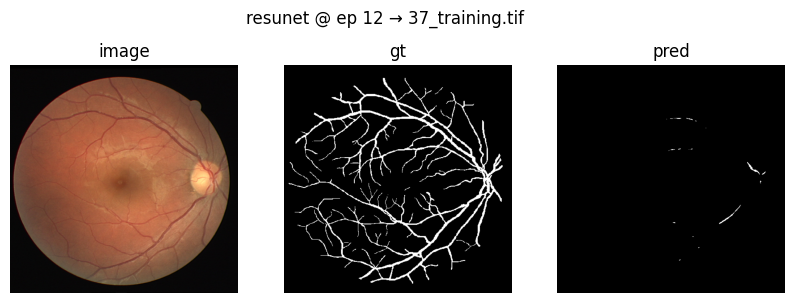

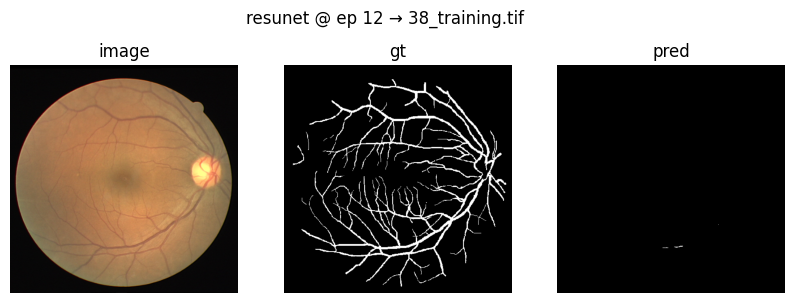

[test resunet] {'loss': 1.4827, 'dice': 0.0012, 'iou': 0.0006, 'acc': 0.3127}


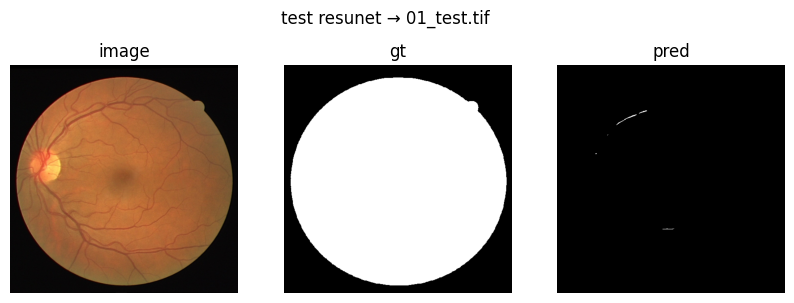

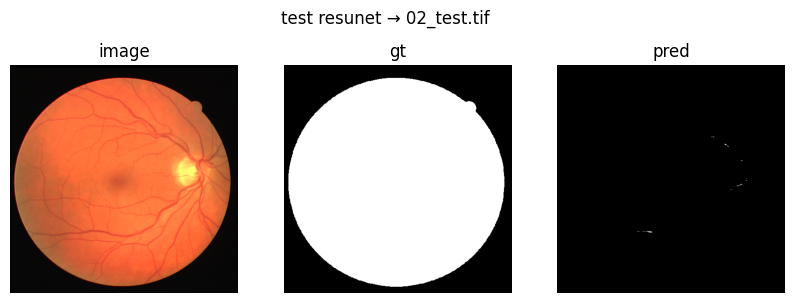

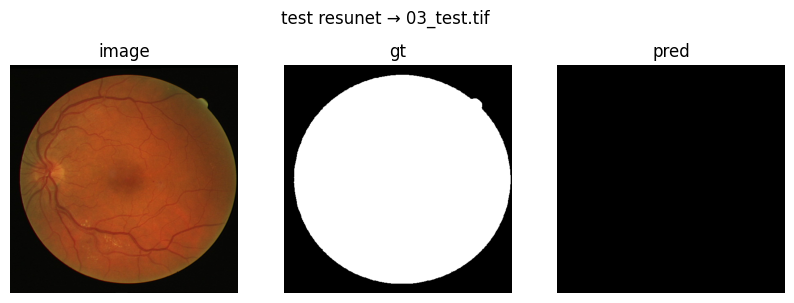

ResU-Net → {'loss': 1.4827, 'dice': 0.0012, 'iou': 0.0006, 'acc': 0.3127, 'iou_avg_test': 0.0006}


In [ ]:
#ResU-Net
import torch
import torch.nn as nn
import torch.nn.functional as F

class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, stride=1):
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, stride=stride, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU(inplace=True)

        self.down = None
        if stride != 1 or in_ch != out_ch:
            self.down = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 1, stride=stride, bias=False),
                nn.BatchNorm2d(out_ch)
            )

    def forward(self, x):
        identity = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        if self.down is not None:
            identity = self.down(identity)
        out += identity
        out = self.relu(out)
        return out

class ResUNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1, base=32):
        super().__init__()
        chs = [base, base*2, base*4, base*8, base*16]

        self.e1 = ResBlock(in_ch,   chs[0])
        self.e2 = ResBlock(chs[0],  chs[1], stride=2)
        self.e3 = ResBlock(chs[1],  chs[2], stride=2)
        self.e4 = ResBlock(chs[2],  chs[3], stride=2)
        self.e5 = ResBlock(chs[3],  chs[4], stride=2)

        self.up4 = nn.ConvTranspose2d(chs[4], chs[3], 2, 2)
        self.d4  = ResBlock(chs[3] + chs[3], chs[3])

        self.up3 = nn.ConvTranspose2d(chs[3], chs[2], 2, 2)
        self.d3  = ResBlock(chs[2] + chs[2], chs[2])

        self.up2 = nn.ConvTranspose2d(chs[2], chs[1], 2, 2)
        self.d2  = ResBlock(chs[1] + chs[1], chs[1])

        self.up1 = nn.ConvTranspose2d(chs[1], chs[0], 2, 2)
        self.d1  = ResBlock(chs[0] + chs[0], chs[0])

        self.out = nn.Conv2d(chs[0], out_ch, 1)

    def forward(self, x):
        x1 = self.e1(x)
        x2 = self.e2(x1)
        x3 = self.e3(x2)
        x4 = self.e4(x3)
        x5 = self.e5(x4)

        d4 = self._up_to(self.up4(x5), x4)
        d4 = self.d4(torch.cat([d4, x4], dim=1))

        d3 = self._up_to(self.up3(d4), x3)
        d3 = self.d3(torch.cat([d3, x3], dim=1))

        d2 = self._up_to(self.up2(d3), x2)
        d2 = self.d2(torch.cat([d2, x2], dim=1))

        d1 = self._up_to(self.up1(d2), x1)
        d1 = self.d1(torch.cat([d1, x1], dim=1))

        return self.out(d1)

    @staticmethod
    def _up_to(x, ref):
        if x.shape[-2:] != ref.shape[-2:]:
            x = F.interpolate(x, size=ref.shape[-2:], mode="bilinear", align_corners=False)
        return x

tag = "resunet"
resunet_ckpt = fit(ResUNet(in_ch=3, out_ch=1, base=32),
                   tag,
                   train_loader,
                   val_loader,
                   epochs=CFG.epochs_unet,
                   lr=CFG.lr,
                   wd=CFG.wd,
                   preview_every=3)

resunet_report = test_report(ResUNet, resunet_ckpt, tag, n_show=3)
resunet_iouavg = per_image_iou_avg(ResUNet, resunet_ckpt)
print("ResU-Net →", {**resunet_report, "iou_avg_test": round(resunet_iouavg, 4)})

segnet | ep 01 | train L 0.7125 | val L 0.6939 D 0.1556 IOU 0.0844
  -> saved best segnet to /content/drive_runs/best_segnet.pt
segnet | ep 02 | train L 0.6270 | val L 0.6860 D 0.0000 IOU 0.0000
segnet | ep 03 | train L 0.5828 | val L 0.6723 D 0.0000 IOU 0.0000


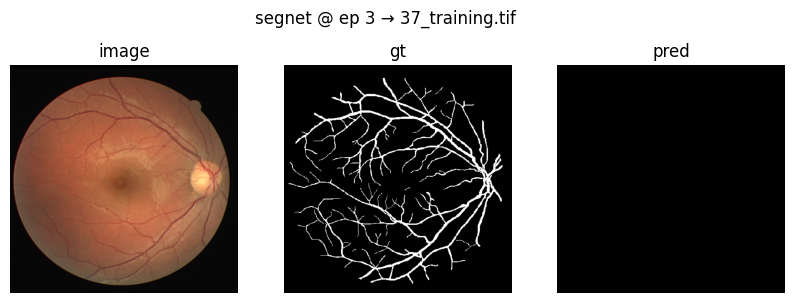

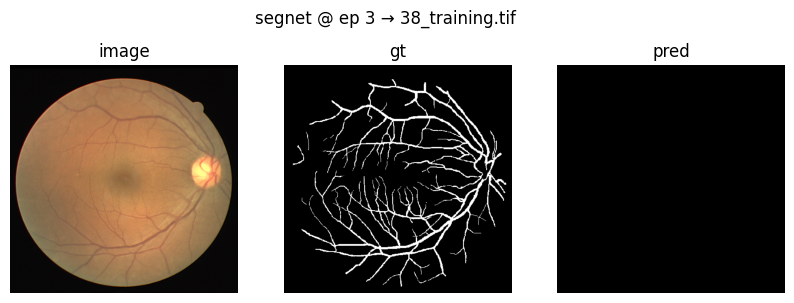

segnet | ep 04 | train L 0.5560 | val L 0.6540 D 0.0000 IOU 0.0000
segnet | ep 05 | train L 0.5345 | val L 0.6359 D 0.0000 IOU 0.0000
segnet | ep 06 | train L 0.5166 | val L 0.6153 D 0.0000 IOU 0.0000


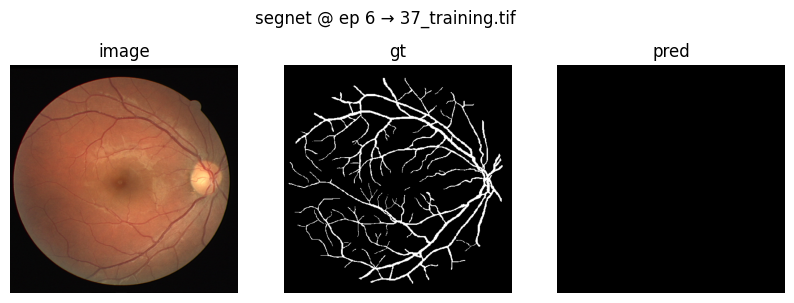

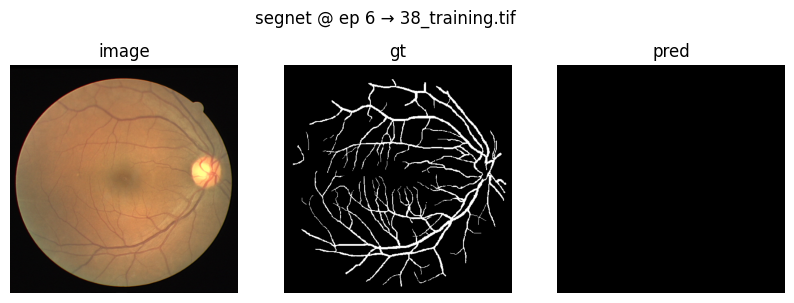

segnet | ep 07 | train L 0.5015 | val L 0.5916 D 0.0000 IOU 0.0000
segnet | ep 08 | train L 0.4849 | val L 0.5705 D 0.0000 IOU 0.0000
segnet | ep 09 | train L 0.4718 | val L 0.5764 D 0.0000 IOU 0.0000


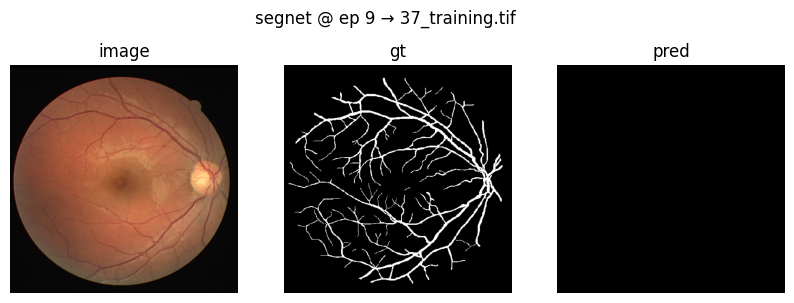

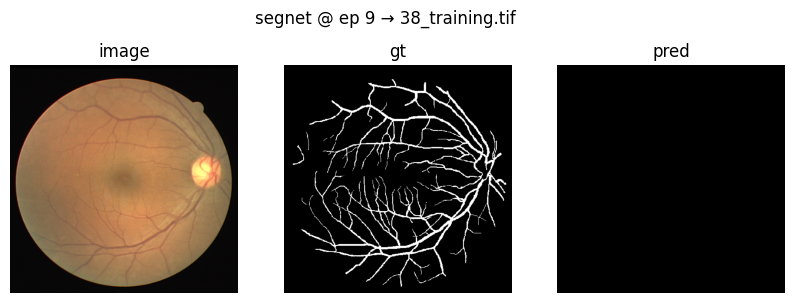

segnet | ep 10 | train L 0.4562 | val L 0.5289 D 0.0000 IOU 0.0000
segnet | ep 11 | train L 0.4443 | val L 0.4940 D 0.0000 IOU 0.0000
segnet | ep 12 | train L 0.4325 | val L 0.4522 D 0.0001 IOU 0.0001


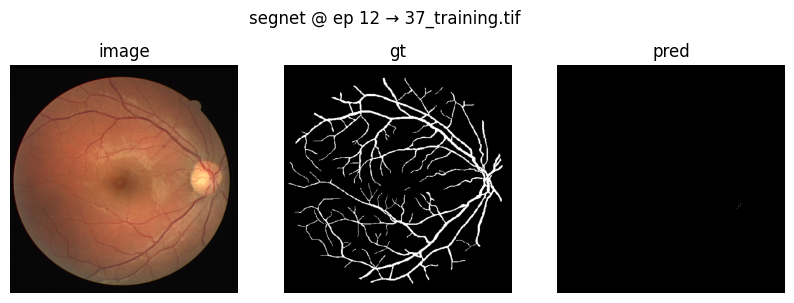

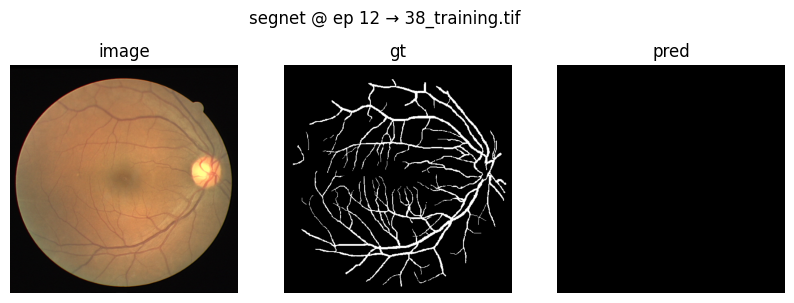

[test segnet] {'loss': 0.6928, 'dice': 0.8189, 'iou': 0.6933, 'acc': 0.6958}


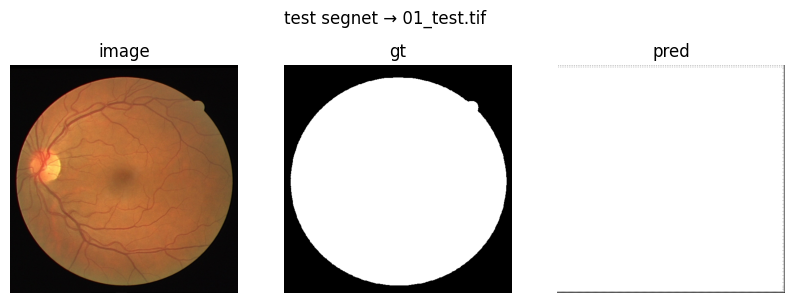

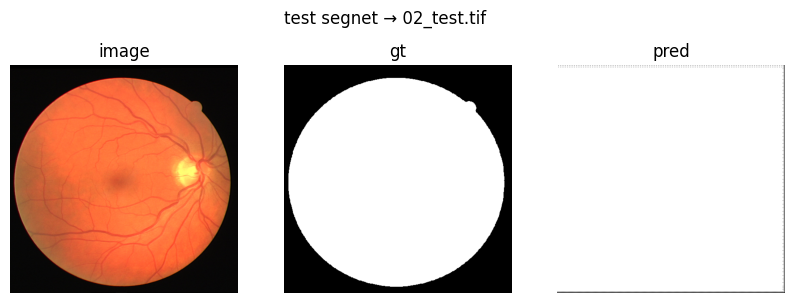

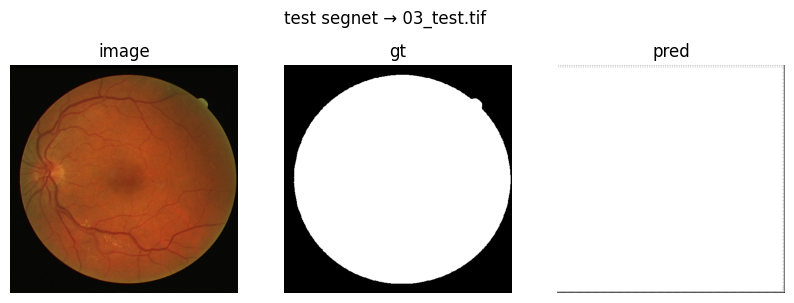

SegNet → {'loss': 0.6928, 'dice': 0.8189, 'iou': 0.6933, 'acc': 0.6958, 'iou_avg_test': 0.6933}


In [ ]:
#SegNet
import torch
import torch.nn as nn
import torch.nn.functional as F

class SegNetEncoder(nn.Module):
    def __init__(self, in_ch=3, base=32):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_ch, base, 3, padding=1), nn.BatchNorm2d(base), nn.ReLU(True),
            nn.Conv2d(base, base, 3, padding=1), nn.BatchNorm2d(base), nn.ReLU(True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(base, base*2, 3, padding=1), nn.BatchNorm2d(base*2), nn.ReLU(True),
            nn.Conv2d(base*2, base*2, 3, padding=1), nn.BatchNorm2d(base*2), nn.ReLU(True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(base*2, base*4, 3, padding=1), nn.BatchNorm2d(base*4), nn.ReLU(True),
            nn.Conv2d(base*4, base*4, 3, padding=1), nn.BatchNorm2d(base*4), nn.ReLU(True),
        )
        self.pool = nn.MaxPool2d(2,2)

    def forward(self, x):
        x1 = self.conv1(x)
        p1 = self.pool(x1)

        x2 = self.conv2(p1)
        p2 = self.pool(x2)

        x3 = self.conv3(p2)
        p3 = self.pool(x3)

        return x1, x2, x3, p3


class SegNetDecoder(nn.Module):
    def __init__(self, base=32, out_ch=1):
        super().__init__()
        self.up3 = nn.ConvTranspose2d(base*4, base*2, 2, 2)
        self.dec3 = nn.Sequential(
            nn.Conv2d(base*2, base*2, 3, padding=1), nn.BatchNorm2d(base*2), nn.ReLU(True),
            nn.Conv2d(base*2, base*2, 3, padding=1), nn.BatchNorm2d(base*2), nn.ReLU(True),
        )

        self.up2 = nn.ConvTranspose2d(base*2, base, 2, 2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(base, base, 3, padding=1), nn.BatchNorm2d(base), nn.ReLU(True),
            nn.Conv2d(base, base, 3, padding=1), nn.BatchNorm2d(base), nn.ReLU(True),
        )

        self.up1 = nn.ConvTranspose2d(base, base, 2, 2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(base, base, 3, padding=1), nn.BatchNorm2d(base), nn.ReLU(True),
        )

        self.out = nn.Conv2d(base, out_ch, 1)

    def forward(self, x1, x2, x3, p3):
        d3 = self.up3(p3)
        if d3.shape[-2:] != x3.shape[-2:]:
            d3 = F.interpolate(d3, size=x3.shape[-2:], mode="bilinear", align_corners=False)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        if d2.shape[-2:] != x2.shape[-2:]:
            d2 = F.interpolate(d2, size=x2.shape[-2:], mode="bilinear", align_corners=False)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        if d1.shape[-2:] != x1.shape[-2:]:
            d1 = F.interpolate(d1, size=x1.shape[-2:], mode="bilinear", align_corners=False)
        d1 = self.dec1(d1)

        return self.out(d1)


class SegNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1, base=32):
        super().__init__()
        self.encoder = SegNetEncoder(in_ch=in_ch, base=base)
        self.decoder = SegNetDecoder(base=base, out_ch=out_ch)

    def forward(self, x):
        x1, x2, x3, p3 = self.encoder(x)
        logits = self.decoder(x1, x2, x3, p3)
        return logits


tag = "segnet"

segnet_ckpt = fit(SegNet(),
                  tag,
                  train_loader,
                  val_loader,
                  epochs=CFG.epochs_unet,
                  lr=CFG.lr,
                  wd=CFG.wd,
                  preview_every=3)

segnet_report = test_report(SegNet, segnet_ckpt, tag, n_show=3)
segnet_iouavg = per_image_iou_avg(SegNet, segnet_ckpt)
print("SegNet →", {**segnet_report, "iou_avg_test": round(segnet_iouavg, 4)})

deeplabv3_r50 | ep 01 | train L 0.6720 | val L 13.0508 D 0.1583 IOU 0.0860
  -> saved best deeplabv3_r50 to /content/drive_runs/best_deeplabv3_r50.pt
deeplabv3_r50 | ep 02 | train L 0.4400 | val L 0.8748 D 0.0000 IOU 0.0000
deeplabv3_r50 | ep 03 | train L 0.3284 | val L 0.3415 D 0.0000 IOU 0.0000


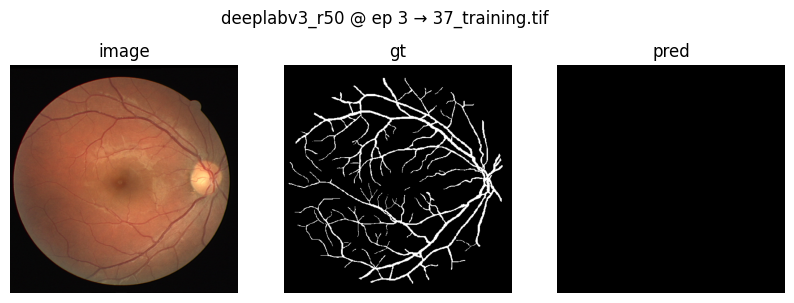

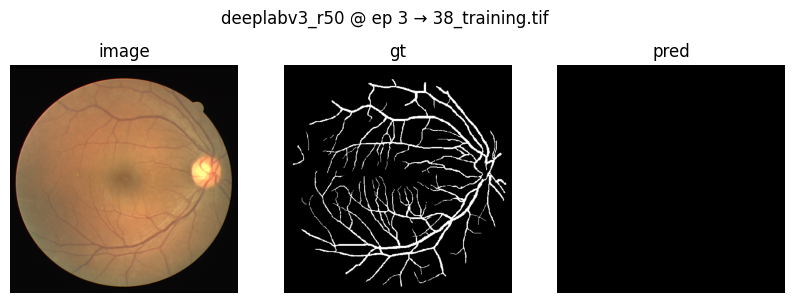

deeplabv3_r50 | ep 04 | train L 0.2828 | val L 0.8357 D 0.0000 IOU 0.0000
deeplabv3_r50 | ep 05 | train L 0.2619 | val L 0.7780 D 0.0000 IOU 0.0000
deeplabv3_r50 | ep 06 | train L 0.2459 | val L 0.3958 D 0.0000 IOU 0.0000


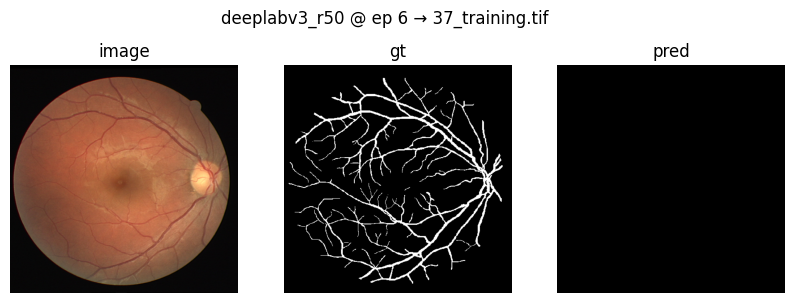

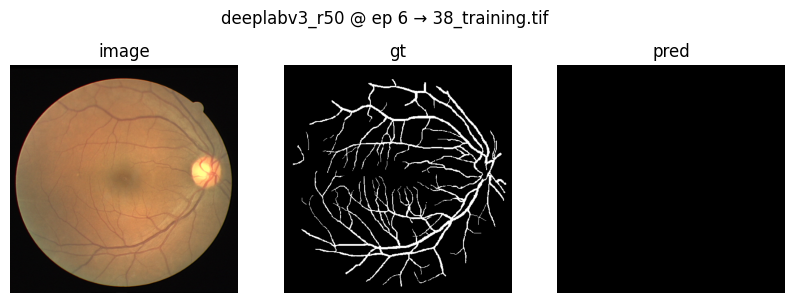

deeplabv3_r50 | ep 07 | train L 0.2349 | val L 0.2883 D 0.0543 IOU 0.0287
deeplabv3_r50 | ep 08 | train L 0.2251 | val L 0.2530 D 0.0628 IOU 0.0333
deeplabv3_r50 | ep 09 | train L 0.2173 | val L 0.2300 D 0.1885 IOU 0.1093
  -> saved best deeplabv3_r50 to /content/drive_runs/best_deeplabv3_r50.pt


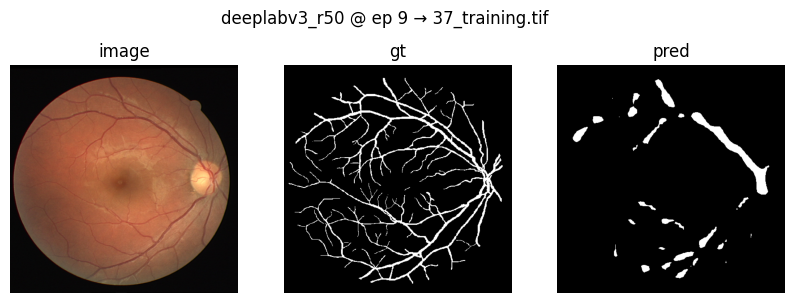

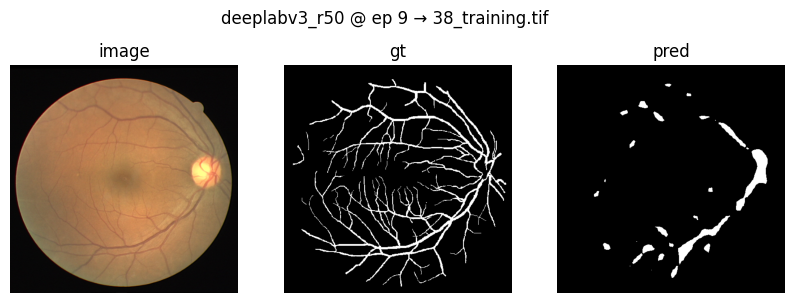

deeplabv3_r50 | ep 10 | train L 0.2104 | val L 0.2243 D 0.3786 IOU 0.2355
  -> saved best deeplabv3_r50 to /content/drive_runs/best_deeplabv3_r50.pt
deeplabv3_r50 | ep 11 | train L 0.2032 | val L 0.2157 D 0.4550 IOU 0.2947
  -> saved best deeplabv3_r50 to /content/drive_runs/best_deeplabv3_r50.pt
deeplabv3_r50 | ep 12 | train L 0.1955 | val L 0.2089 D 0.5088 IOU 0.3414
  -> saved best deeplabv3_r50 to /content/drive_runs/best_deeplabv3_r50.pt


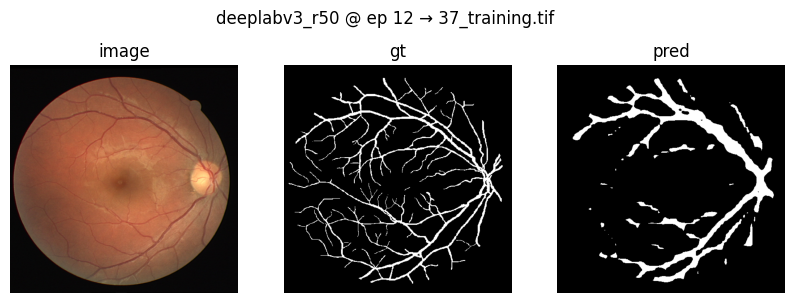

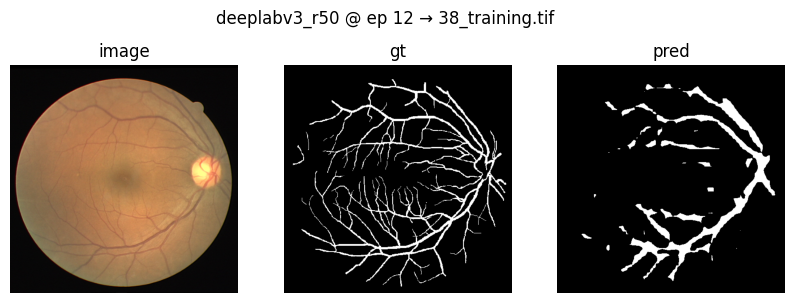

[test deeplabv3_r50] {'loss': 1.7412, 'dice': 0.2, 'iou': 0.1115, 'acc': 0.3889}


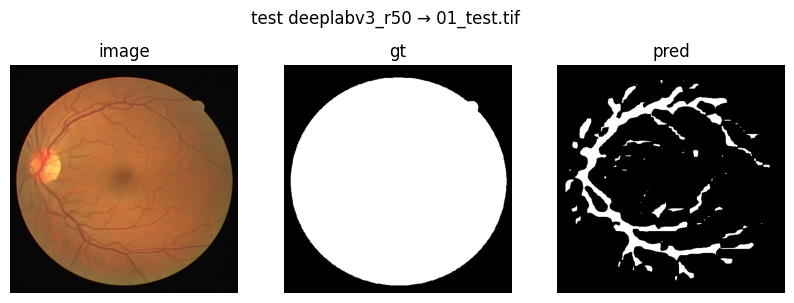

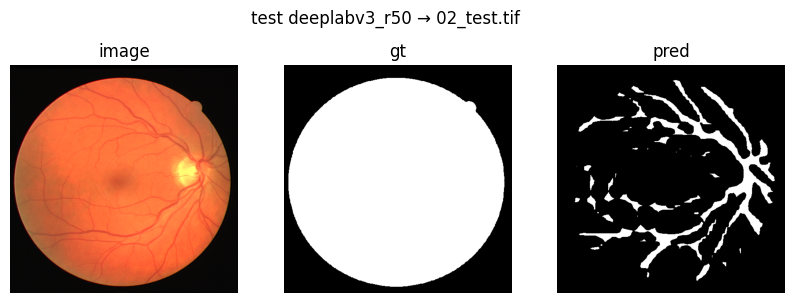

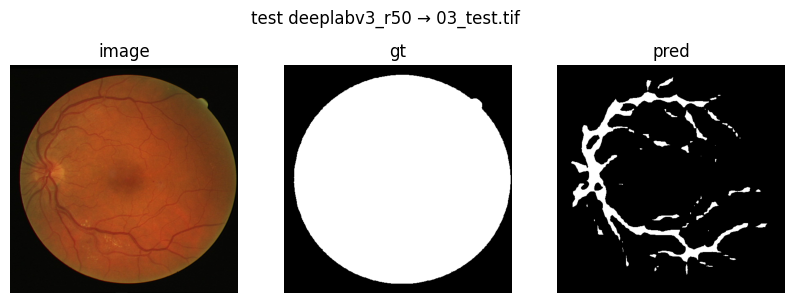

DeepLabV3-ResNet50 → {'loss': 1.7412, 'dice': 0.2, 'iou': 0.1115, 'acc': 0.3889, 'iou_avg_test': 0.1115}


In [ ]:
#DeepLabV3-ResNet50
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models.segmentation import deeplabv3_resnet50

class DeepLabV3R50(nn.Module):
    def __init__(self, num_classes=1):
        super().__init__()
        self.m = deeplabv3_resnet50(weights=None, aux_loss=False)
        in_ch = self.m.classifier[4].in_channels
        self.m.classifier[4] = nn.Conv2d(in_ch, num_classes, 1)

    def forward(self, x):
        out = self.m(x)["out"]
        if out.shape[-2:] != x.shape[-2:]:
            out = F.interpolate(out, size=x.shape[-2:], mode="bilinear", align_corners=False)
        return out

tag = "deeplabv3_r50"
deeplab_ckpt = fit(DeepLabV3R50(num_classes=1),
                   tag,
                   train_loader,
                   val_loader,
                   epochs=CFG.epochs_unet,
                   lr=CFG.lr,
                   wd=CFG.wd,
                   preview_every=3)

deeplab_report = test_report(DeepLabV3R50, deeplab_ckpt, tag, n_show=3)
deeplab_iouavg = per_image_iou_avg(DeepLabV3R50, deeplab_ckpt)
print("DeepLabV3-ResNet50 →", {**deeplab_report, "iou_avg_test": round(deeplab_iouavg, 4)})

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-8738ca79.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-8738ca79.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 173MB/s]


lraspp_mnetv3 | ep 01 | train L 0.6401 | val L 0.5510 D 0.1210 IOU 0.0654
  -> saved best lraspp_mnetv3 to /content/drive_runs/best_lraspp_mnetv3.pt
lraspp_mnetv3 | ep 02 | train L 0.3922 | val L 0.4098 D 0.0049 IOU 0.0025
lraspp_mnetv3 | ep 03 | train L 0.3165 | val L 0.2944 D 0.0000 IOU 0.0000


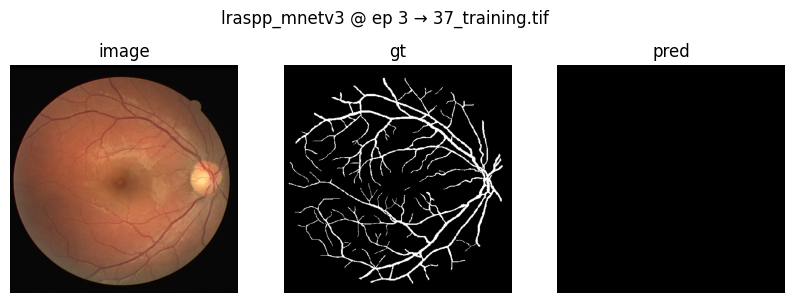

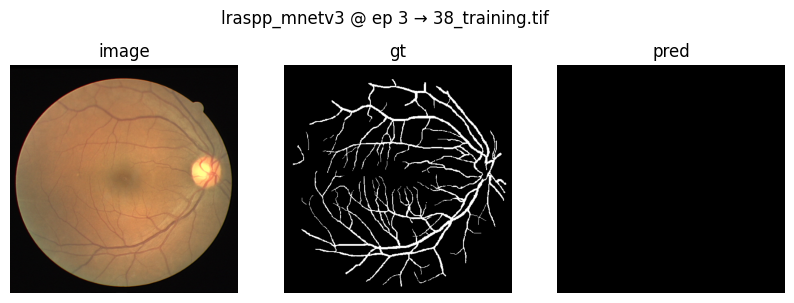

lraspp_mnetv3 | ep 04 | train L 0.2818 | val L 0.2682 D 0.0000 IOU 0.0000
lraspp_mnetv3 | ep 05 | train L 0.2596 | val L 0.2645 D 0.0000 IOU 0.0000
lraspp_mnetv3 | ep 06 | train L 0.2422 | val L 0.2713 D 0.0000 IOU 0.0000


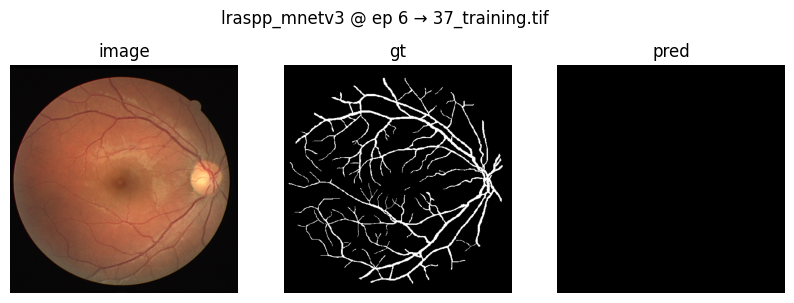

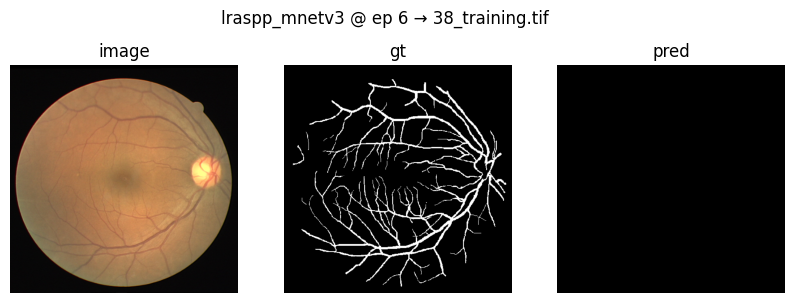

lraspp_mnetv3 | ep 07 | train L 0.2291 | val L 0.2854 D 0.0000 IOU 0.0000
lraspp_mnetv3 | ep 08 | train L 0.2190 | val L 0.2945 D 0.0000 IOU 0.0000
lraspp_mnetv3 | ep 09 | train L 0.2100 | val L 0.2971 D 0.0000 IOU 0.0000


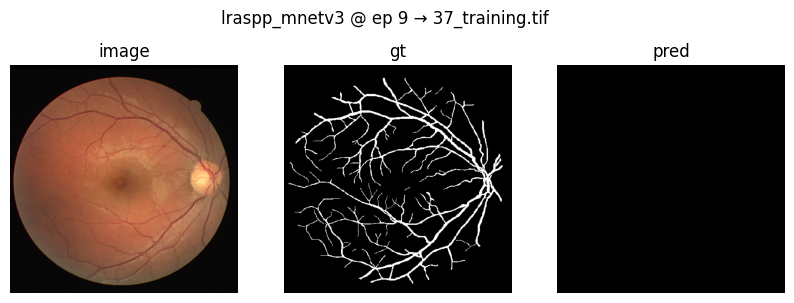

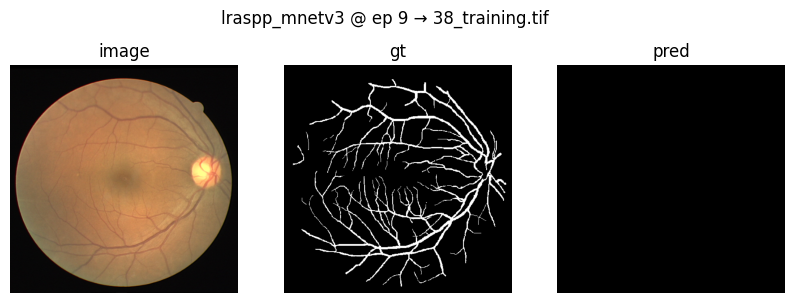

lraspp_mnetv3 | ep 10 | train L 0.2023 | val L 0.3021 D 0.0000 IOU 0.0000
lraspp_mnetv3 | ep 11 | train L 0.1971 | val L 0.3017 D 0.0000 IOU 0.0000
lraspp_mnetv3 | ep 12 | train L 0.1913 | val L 0.3065 D 0.0000 IOU 0.0000


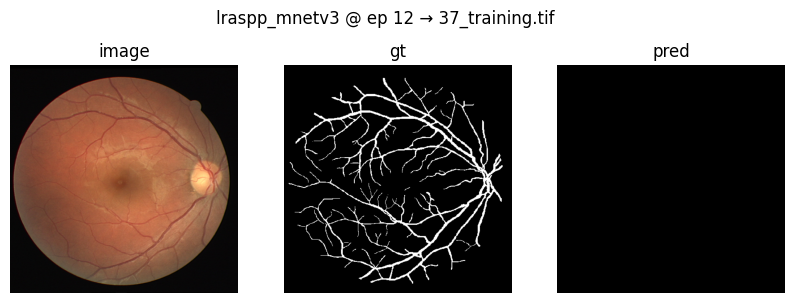

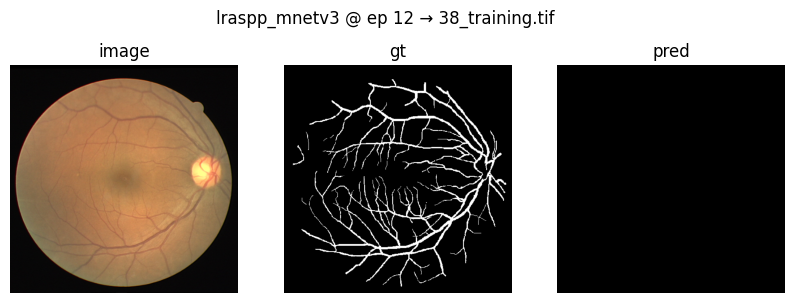

[test lraspp_mnetv3] {'loss': 0.8083, 'dice': 0.0411, 'iou': 0.0212, 'acc': 0.3245}


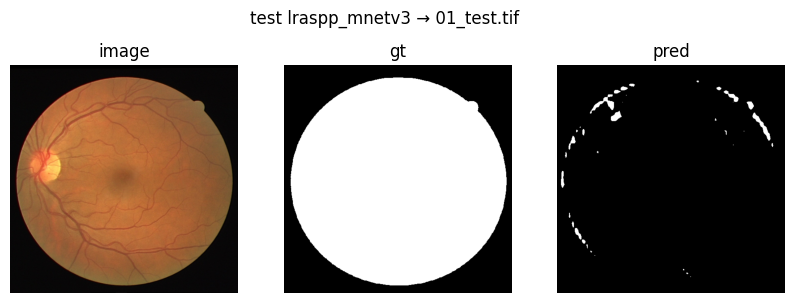

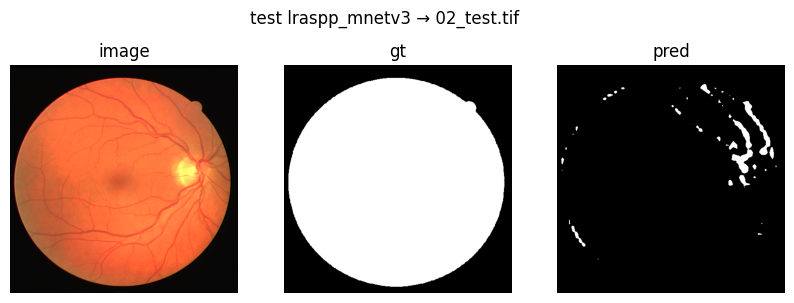

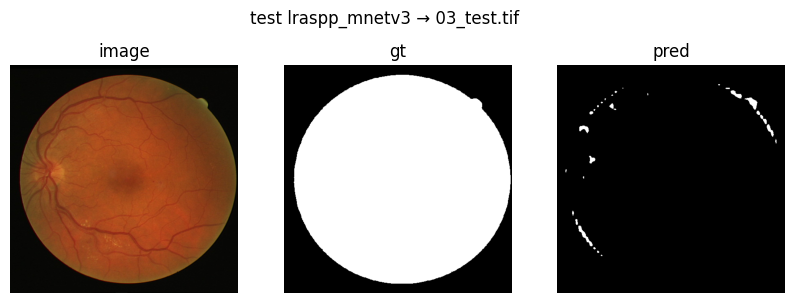

LR-ASPP MobileNetV3 → {'loss': 0.8083, 'dice': 0.0411, 'iou': 0.0212, 'acc': 0.3245, 'iou_avg_test': 0.0212}


In [ ]:
#LR-ASPP MobileNetV3
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models.segmentation import lraspp_mobilenet_v3_large

class LRASPPMobileNetV3(nn.Module):
    def __init__(self, num_classes=1):
        super().__init__()
        self.m = lraspp_mobilenet_v3_large(weights=None)
        in_ch = self.m.classifier.low_classifier.out_channels

        self.m.classifier.low_classifier  = nn.Conv2d(self.m.classifier.low_classifier.in_channels,
                                                      num_classes, kernel_size=1)
        self.m.classifier.high_classifier = nn.Conv2d(self.m.classifier.high_classifier.in_channels,
                                                      num_classes, kernel_size=1)

    def forward(self, x):
        out = self.m(x)["out"]
        if out.shape[-2:] != x.shape[-2:]:
            out = F.interpolate(out, size=x.shape[-2:], mode="bilinear", align_corners=False)
        return out

tag = "lraspp_mnetv3"
lraspp_ckpt = fit(LRASPPMobileNetV3(num_classes=1),
                  tag,
                  train_loader,
                  val_loader,
                  epochs=CFG.epochs_unet,
                  lr=CFG.lr,
                  wd=CFG.wd,
                  preview_every=3)

lraspp_report = test_report(LRASPPMobileNetV3, lraspp_ckpt, tag, n_show=3)
lraspp_iouavg = per_image_iou_avg(LRASPPMobileNetV3, lraspp_ckpt)
print("LR-ASPP MobileNetV3 →", {**lraspp_report, "iou_avg_test": round(lraspp_iouavg, 4)})

In [ ]:
import pandas as pd
from pathlib import Path

rows = []

def add_model_row(pretty_name, tag, ModelCtor):
    ckpt = Path(CFG.out_dir) / f"best_{tag}.pt"
    if not ckpt.exists():
        print(f"⚠️ Skipping {pretty_name}: checkpoint {ckpt.name} not found.")
        return

    rpt = test_report(ModelCtor, ckpt, tag, n_show=0)
    iou_mean = per_image_iou_avg(ModelCtor, ckpt)

    rows.append({
        "Model": pretty_name,
        "Intersection over Union (IoU)": rpt["iou"],
        "Mean IoU": round(iou_mean, 4),
        "Dice Coefficient": rpt["dice"],
        "Accuracy": rpt["acc"],
        "Loss": rpt["loss"],
    })

add_model_row("U-Net",               "unet",            UNet)
add_model_row("FCN-ResNet50",        "fcn_resnet50",    FCNResNet50)
add_model_row("U-Net++",             "unetpp",          NestedUNet)
add_model_row("Attention U-Net",     "att_unet",        AttUNet)
add_model_row("ResU-Net",            "resunet",         ResUNet)
add_model_row("SegNet",              "segnet",          SegNet)
add_model_row("DeepLabV3-ResNet50",  "deeplabv3_r50",   DeepLabV3R50)
add_model_row("LR-ASPP MobileNetV3", "lraspp_mnetv3",   LRASPPMobileNetV3)

df = pd.DataFrame(rows).round(4)
display(df)

table_path = Path(CFG.out_dir) / "all_8_models_comparison_metrics.csv"
df.to_csv(table_path, index=False)
print("Saved comparison table to:", table_path)

[test unet] {'loss': 0.4254, 'dice': 0.8851, 'iou': 0.8108, 'acc': 0.87}
[test fcn_resnet50] {'loss': 8.5915, 'dice': 0.3095, 'iou': 0.1833, 'acc': 0.3735}
[test unetpp] {'loss': 0.6837, 'dice': 0.815, 'iou': 0.6877, 'acc': 0.6877}
[test att_unet] {'loss': 1.2821, 'dice': 0.0199, 'iou': 0.0101, 'acc': 0.3191}
[test resunet] {'loss': 1.4827, 'dice': 0.0012, 'iou': 0.0006, 'acc': 0.3127}
[test segnet] {'loss': 0.6928, 'dice': 0.8189, 'iou': 0.6933, 'acc': 0.6958}
[test deeplabv3_r50] {'loss': 1.7412, 'dice': 0.2, 'iou': 0.1115, 'acc': 0.3889}
[test lraspp_mnetv3] {'loss': 0.8083, 'dice': 0.0411, 'iou': 0.0212, 'acc': 0.3245}


,Model,Intersection over Union (IoU),Mean IoU,Dice Coefficient,Accuracy,Loss
0,U-Net,0.8108,0.8108,0.8851,0.8700,0.4254
1,FCN-ResNet50,0.1833,0.1833,0.3095,0.3735,8.5915
2,U-Net++,0.6877,0.6877,0.8150,0.6877,0.6837
3,Attention U-Net,0.0101,0.0101,0.0199,0.3191,1.2821
4,ResU-Net,0.0006,0.0006,0.0012,0.3127,1.4827
5,SegNet,0.6933,0.6933,0.8189,0.6958,0.6928
6,DeepLabV3-ResNet50,0.1115,0.1115,0.2000,0.3889,1.7412
7,LR-ASPP MobileNetV3,0.0212,0.0212,0.0411,0.3245,0.8083


Saved comparison table to: /content/drive_runs/all_8_models_comparison_metrics.csv
